In [15]:
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
import cv2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [16]:
def build_df(path):
    classes, class_paths = zip(*[(label, os.path.join(path, label, image))
                                for label in os.listdir(path) if os.path.isdir(os.path.join(path, label))
                                for image in os.listdir(os.path.join(path, label))])
    return pd.DataFrame({'Class Path': class_paths, 'Class': classes})

training_data = build_df(r"C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training")
testing_data = build_df(r"C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Testing")

In [3]:
print("Training data shape:", training_data.shape)
print(training_data['Class'].value_counts())

print("Testing data shape:", testing_data.shape)
print(testing_data['Class'].value_counts())

Training data shape: (5600, 2)
Class
glioma        1400
meningioma    1400
notumor       1400
pituitary     1400
Name: count, dtype: int64
Testing data shape: (1600, 2)
Class
glioma        400
meningioma    400
notumor       400
pituitary     400
Name: count, dtype: int64


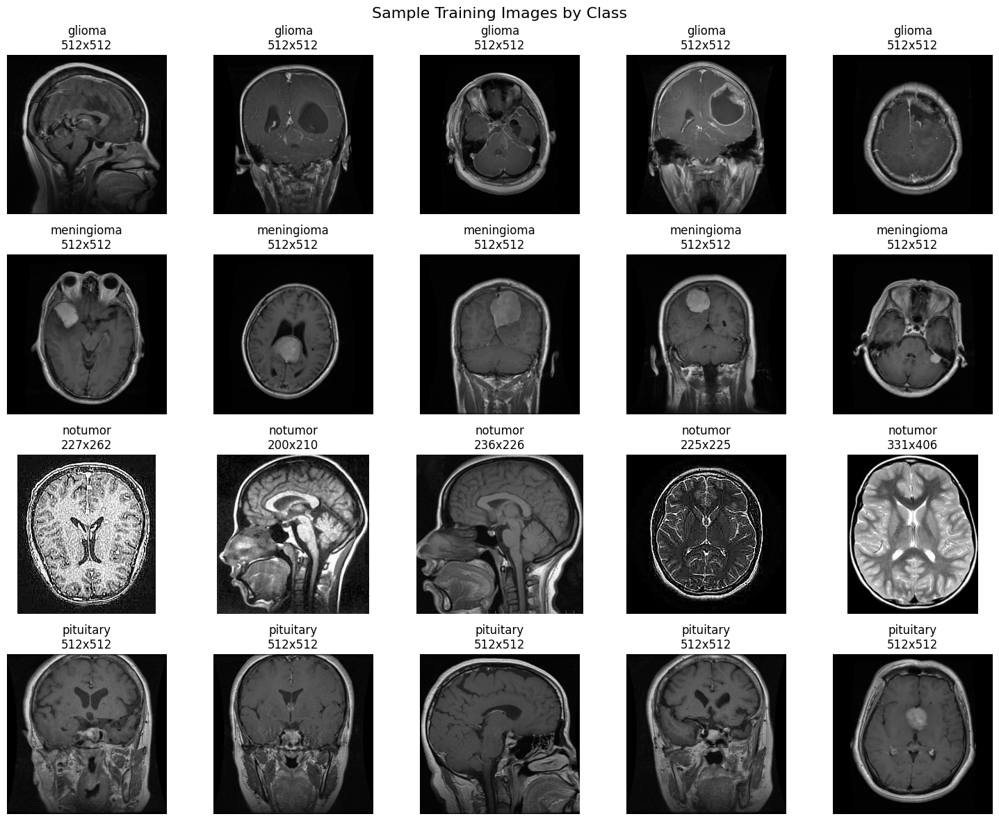

In [17]:
# Display a balanced sample from each class.
classes = sorted(training_data['Class'].unique())
samples_per_class = 5
fig, axes = plt.subplots(len(classes), samples_per_class, figsize=(15, 3 * len(classes)))

for row, class_name in enumerate(classes):
    class_rows = training_data[training_data['Class'] == class_name].sample(
        n=min(samples_per_class, (training_data['Class'] == class_name).sum()),
        random_state=42
    )
    for column in range(samples_per_class):
        axis = axes[row, column] if len(classes) > 1 else axes[column]
        axis.axis('off')
        if column < len(class_rows):
            image_path = class_rows.iloc[column]['Class Path']
            image = Image.open(image_path).convert('RGB')
            axis.imshow(image)
            axis.set_title(f'{class_name}\n{image.size[0]}x{image.size[1]}')
    
plt.suptitle('Sample Training Images by Class', fontsize=16)
plt.tight_layout()
plt.show()

In [20]:
# Record dimensions for up to 200 sampled training images.
dimension_sample = training_data.sample(n=min(200, len(training_data)), random_state=42)
dimension_records = []

for _, row in dimension_sample.iterrows():
    with Image.open(row['Class Path']) as image:
        width, height = image.size
    dimension_records.append({
        'Class': row['Class'],
        'Class Path': row['Class Path'],
        'Width': width,
        'Height': height,
        'Dimensions': (width, height)
    })

dimensions_df = pd.DataFrame(dimension_records)
print('Sampled images:', len(dimensions_df))
print('Unique dimensions:', dimensions_df['Dimensions'].nunique())
print('\nMost common dimensions:')
print(dimensions_df['Dimensions'].value_counts().head(15))
print('\nDimension summary:')
print(dimensions_df[['Width', 'Height']].describe().round(1))

Sampled images: 200
Unique dimensions: 40

Most common dimensions:
Dimensions
(512, 512)    144
(225, 225)     10
(228, 221)      3
(630, 630)      2
(206, 244)      2
(232, 217)      2
(359, 449)      2
(441, 442)      2
(442, 442)      2
(205, 251)      1
(201, 210)      1
(200, 252)      1
(233, 228)      1
(235, 227)      1
(173, 201)      1
Name: count, dtype: int64

Dimension summary:
        Width  Height
count   200.0   200.0
mean    468.7   474.6
std     139.9   135.5
min     173.0   201.0
25%     512.0   512.0
50%     512.0   512.0
75%     512.0   512.0
max    1335.0  1302.0


Near-black pixel fraction by class (threshold <= 10/255):
            count   mean    std    min    25%    50%    75%    max
Class                                                             
glioma       51.0  0.511  0.123  0.162  0.448  0.501  0.613  0.736
meningioma   53.0  0.502  0.111  0.246  0.425  0.504  0.591  0.724
notumor      49.0  0.351  0.196  0.000  0.232  0.373  0.504  0.671
pituitary    47.0  0.334  0.112  0.145  0.250  0.326  0.439  0.570


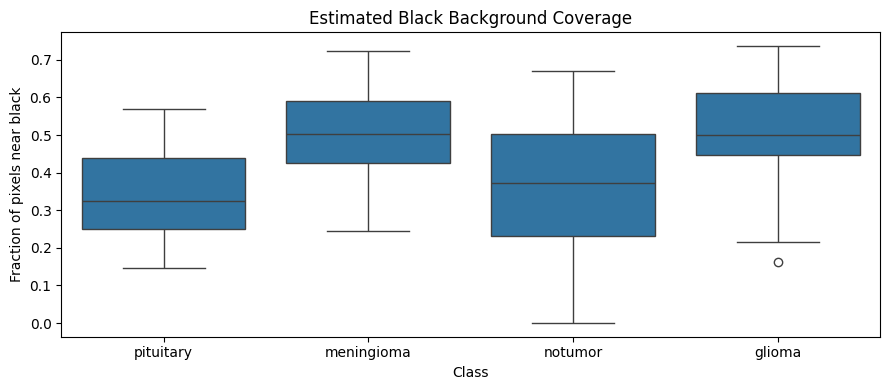

In [21]:
# Estimate the fraction of near-black pixels in the sampled images.
black_pixel_records = []

for _, row in dimension_sample.iterrows():
    with Image.open(row['Class Path']) as image:
        image_array = np.asarray(image.convert('L'))
    black_fraction = (image_array <= 10).mean()
    black_pixel_records.append({
        'Class': row['Class'],
        'Class Path': row['Class Path'],
        'Black Pixel Fraction': black_fraction
    })

black_fraction_df = pd.DataFrame(black_pixel_records)
print('Near-black pixel fraction by class (threshold <= 10/255):')
print(black_fraction_df.groupby('Class')['Black Pixel Fraction'].describe().round(3))

plt.figure(figsize=(9, 4))
sns.boxplot(data=black_fraction_df, x='Class', y='Black Pixel Fraction')
plt.title('Estimated Black Background Coverage')
plt.ylabel('Fraction of pixels near black')
plt.xlabel('Class')
plt.tight_layout()
plt.show()

In [7]:
# Check if RGB channels are identical (grayscale saved as 3-channel)
sample = training_data.sample(20, random_state=42)
for _, row in sample.iterrows():
    img = np.asarray(Image.open(row['Class Path']).convert('RGB'))
    if img.ndim == 3 and img.shape[2] == 3:
        identical = np.allclose(img[:,:,0], img[:,:,1]) and np.allclose(img[:,:,1], img[:,:,2])
        print(row['Class'], 'channels identical:', identical)

pituitary channels identical: True
pituitary channels identical: True
meningioma channels identical: True
meningioma channels identical: True
notumor channels identical: True
notumor channels identical: True
meningioma channels identical: True
meningioma channels identical: True
notumor channels identical: True
glioma channels identical: True
meningioma channels identical: True
meningioma channels identical: True
notumor channels identical: True
meningioma channels identical: True
glioma channels identical: True
pituitary channels identical: True
meningioma channels identical: True
glioma channels identical: True
meningioma channels identical: True
meningioma channels identical: True


In [8]:
# Scan every listed image and record files that cannot be opened or decoded.
all_data = pd.concat([training_data, testing_data], ignore_index=True)
corrupt_files = []

for _, row in all_data.iterrows():
    try:
        with Image.open(row['Class Path']) as image:
            image.verify()
        with Image.open(row['Class Path']) as image:
            image.load()
    except Exception as error:
        corrupt_files.append({
            'Class': row['Class'],
            'Class Path': row['Class Path'],
            'Error': f'{type(error).__name__}: {error}'
        })

corrupt_files_df = pd.DataFrame(corrupt_files, columns=['Class', 'Class Path', 'Error'])
print(f'Checked {len(all_data)} images.')
print(f'Unreadable or corrupt images: {len(corrupt_files_df)}')
if len(corrupt_files_df):
    display(corrupt_files_df)
else:
    print('All images opened and decoded successfully.')

Checked 7200 images.
Unreadable or corrupt images: 0
All images opened and decoded successfully.


## Crop and Resize Prototype

Process one image at a time with Otsu thresholding and the largest detected contour. The fallback counter records images where no contour is found.

In [18]:
crop_fallback_count = 0
full_image_bbox_count = 0


def crop_and_resize_image(
    image_path,
    output_size=(224, 224),
    threshold_method='fixed',
    opening_kernel_size=5,
    min_contour_area_ratio=0.01,
    return_details=False
):
    global crop_fallback_count, full_image_bbox_count

    grayscale_image = np.asarray(Image.open(image_path).convert('L'))
    blurred_image = cv2.GaussianBlur(grayscale_image, (5, 5), 0)
    if threshold_method == 'otsu':
        _, thresholded_image = cv2.threshold(
            blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
        )
    elif threshold_method == 'fixed':
        _, thresholded_image = cv2.threshold(
            blurred_image, 15, 255, cv2.THRESH_BINARY
        )
    else:
        raise ValueError("threshold_method must be 'otsu' or 'fixed'")

    cleanup_kernel = np.ones((opening_kernel_size, opening_kernel_size), dtype=np.uint8)
    thresholded_image = cv2.morphologyEx(
        thresholded_image, cv2.MORPH_OPEN, cleanup_kernel
    )
    thresholded_image = cv2.morphologyEx(
        thresholded_image, cv2.MORPH_CLOSE, cleanup_kernel
    )
    contours, _ = cv2.findContours(
        thresholded_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    image_area = grayscale_image.shape[0] * grayscale_image.shape[1]
    minimum_contour_area = min_contour_area_ratio * image_area
    valid_contours = [
        contour for contour in contours
        if cv2.contourArea(contour) >= minimum_contour_area
    ]

    if not valid_contours:
        crop_fallback_count += 1
        crop = grayscale_image
        bounding_box = (0, 0, grayscale_image.shape[1], grayscale_image.shape[0])
    else:
        largest_contour = max(valid_contours, key=cv2.contourArea)
        x, y, width, height = cv2.boundingRect(largest_contour)
        bounding_box = (x, y, width, height)
        if bounding_box == (0, 0, grayscale_image.shape[1], grayscale_image.shape[0]):
            full_image_bbox_count += 1
        crop = grayscale_image[y:y + height, x:x + width]

    processed_image = cv2.resize(crop, output_size, interpolation=cv2.INTER_AREA)
    if return_details:
        return processed_image, thresholded_image, bounding_box
    return processed_image

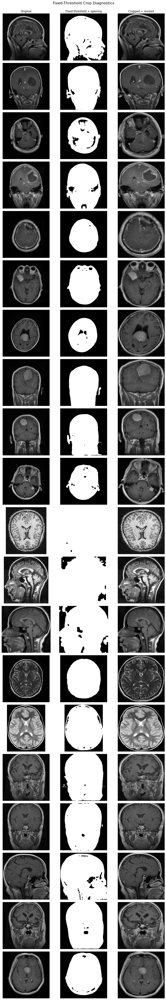

Bounding boxes and crop-to-original ratios:


,Class,Method,Path,Original (W x H),"Bounding Box (x, y, w, h)",Width Ratio,Height Ratio
0,glioma,Otsu,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(62, 37, 387, 471)",0.755859,0.919922
1,glioma,Fixed 15,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(61, 36, 390, 476)",0.761719,0.929688
2,glioma,Otsu,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(49, 12, 407, 500)",0.794922,0.976562
3,glioma,Fixed 15,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(42, 9, 421, 503)",0.822266,0.982422
4,meningioma,Otsu,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(93, 45, 365, 423)",0.712891,0.826172
5,meningioma,Fixed 15,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(91, 44, 368, 425)",0.718750,0.830078
6,meningioma,Otsu,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(97, 7, 311, 462)",0.607422,0.902344
7,meningioma,Fixed 15,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,512 x 512,"(95, 4, 315, 466)",0.615234,0.910156
8,notumor,Otsu,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,201 x 251,"(18, 9, 161, 233)",0.800995,0.928287
9,notumor,Fixed 15,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,201 x 251,"(5, 7, 187, 238)",0.930348,0.948207


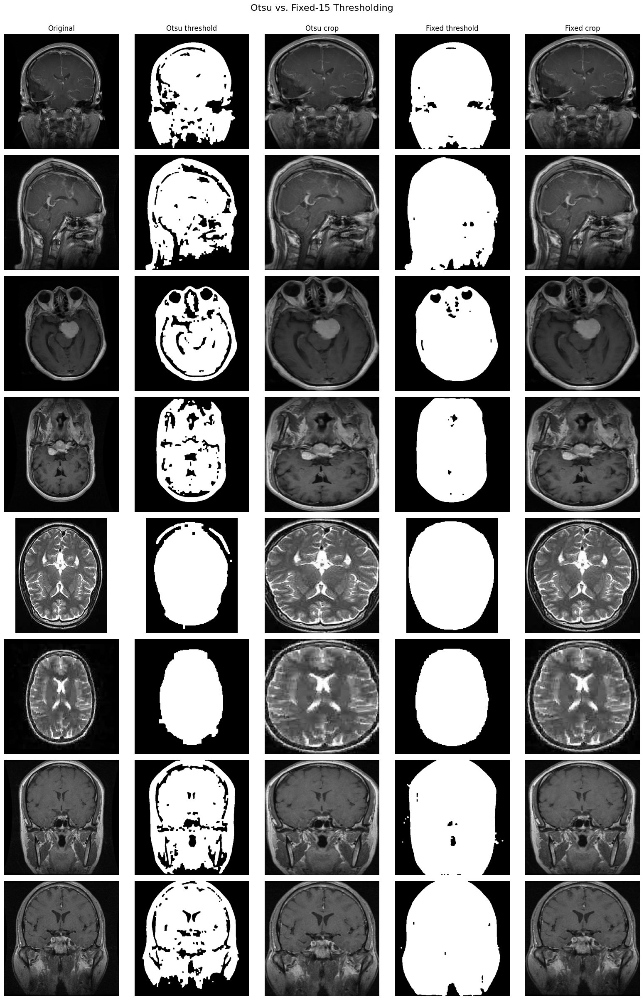

Lowest sampled notumor black-pixel fraction: 0.000
Fixed-threshold edge-case bounding box: (0, 0, 442, 442)
Fallbacks used so far: 0


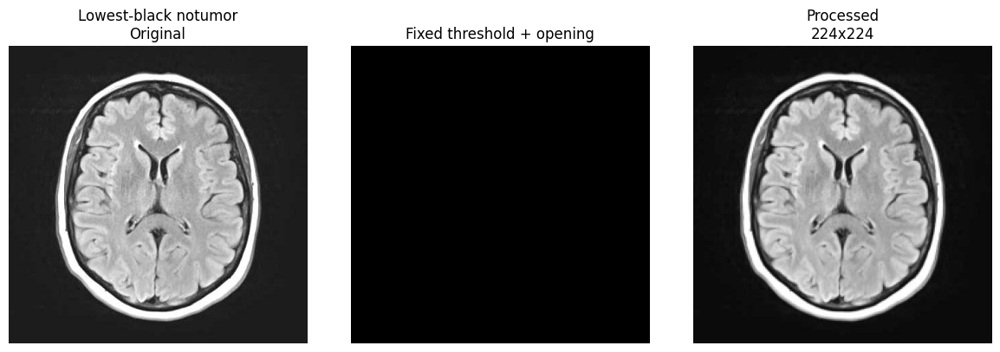

In [22]:
# Compare original, cleaned threshold, and cropped images using the fixed threshold.
samples_per_class = 5
comparison_rows = []

for class_name in classes:
    class_rows = training_data[training_data['Class'] == class_name].sample(
        n=samples_per_class, random_state=42
    ).reset_index(drop=True)
    for _, image_row in class_rows.iterrows():
        image_path = image_row['Class Path']
        original_image = np.asarray(Image.open(image_path).convert('L'))
        processed_image, thresholded_image, bounding_box = crop_and_resize_image(
            image_path, threshold_method='fixed', return_details=True
        )
        comparison_rows.append({
            'Class': class_name,
            'Path': image_path,
            'Original': original_image,
            'Thresholded': thresholded_image,
            'Processed': processed_image,
            'Bounding Box': bounding_box
        })

fig, axes = plt.subplots(len(comparison_rows), 3, figsize=(11, 3 * len(comparison_rows)))
for row, item in enumerate(comparison_rows):
    axes[row, 0].imshow(item['Original'], cmap='gray')
    axes[row, 1].imshow(item['Thresholded'], cmap='gray')
    axes[row, 2].imshow(item['Processed'], cmap='gray')
    axes[row, 0].set_ylabel(item['Class'], fontsize=9)
    axes[row, 0].set_title('Original') if row == 0 else None
    axes[row, 1].set_title('Fixed threshold + opening') if row == 0 else None
    axes[row, 2].set_title('Cropped + resized') if row == 0 else None
    for axis in axes[row]:
        axis.axis('off')

plt.suptitle('Fixed-Threshold Crop Diagnostics', fontsize=16, y=1.0)
plt.tight_layout()
plt.show()

# Compare Otsu and fixed thresholding and print crop size relative to each source image.
comparison_subset = training_data.groupby('Class', group_keys=False).head(2).reset_index(drop=True)
box_records = []

for _, row in comparison_subset.iterrows():
    original_height, original_width = np.asarray(Image.open(row['Class Path']).convert('L')).shape
    _, _, otsu_box = crop_and_resize_image(
        row['Class Path'], threshold_method='otsu', return_details=True
    )
    _, _, fixed_box = crop_and_resize_image(
        row['Class Path'], threshold_method='fixed', return_details=True
    )
    box_records.extend([
        {
            'Class': row['Class'],
            'Method': 'Otsu',
            'Path': row['Class Path'],
            'Original (W x H)': f'{original_width} x {original_height}',
            'Bounding Box (x, y, w, h)': otsu_box,
            'Width Ratio': otsu_box[2] / original_width,
            'Height Ratio': otsu_box[3] / original_height
        },
        {
            'Class': row['Class'],
            'Method': 'Fixed 15',
            'Path': row['Class Path'],
            'Original (W x H)': f'{original_width} x {original_height}',
            'Bounding Box (x, y, w, h)': fixed_box,
            'Width Ratio': fixed_box[2] / original_width,
            'Height Ratio': fixed_box[3] / original_height
        }
    ])

bounding_box_df = pd.DataFrame(box_records)
print('Bounding boxes and crop-to-original ratios:')
display(bounding_box_df)

# Visual comparison of the two threshold choices on the same images.
fig, axes = plt.subplots(len(comparison_subset), 5, figsize=(16, 3 * len(comparison_subset)))
for row_number, (_, item) in enumerate(comparison_subset.iterrows()):
    original = np.asarray(Image.open(item['Class Path']).convert('L'))
    otsu_processed, otsu_thresholded, _ = crop_and_resize_image(
        item['Class Path'], threshold_method='otsu', return_details=True
    )
    fixed_processed, fixed_thresholded, _ = crop_and_resize_image(
        item['Class Path'], threshold_method='fixed', return_details=True
    )
    images = [original, otsu_thresholded, otsu_processed, fixed_thresholded, fixed_processed]
    titles = ['Original', 'Otsu threshold', 'Otsu crop', 'Fixed threshold', 'Fixed crop']
    for column, (image, title) in enumerate(zip(images, titles)):
        axes[row_number, column].imshow(image, cmap='gray')
        axes[row_number, column].set_title(title if row_number == 0 else '')
        axes[row_number, column].axis('off')
    axes[row_number, 0].set_ylabel(item['Class'], fontsize=9)

plt.suptitle('Otsu vs. Fixed-15 Thresholding', fontsize=16, y=1.0)
plt.tight_layout()
plt.show()

# Re-check the lowest-black-fraction notumor image with the fixed threshold.
notumor_edge_case = black_fraction_df[black_fraction_df['Class'] == 'notumor'].loc[
    lambda frame: frame['Black Pixel Fraction'].idxmin()
]
edge_path = notumor_edge_case['Class Path']
edge_original = np.asarray(Image.open(edge_path).convert('L'))
edge_processed, edge_thresholded, edge_box = crop_and_resize_image(
    edge_path, threshold_method='fixed', return_details=True
)
print(f"Lowest sampled notumor black-pixel fraction: {notumor_edge_case['Black Pixel Fraction']:.3f}")
print(f'Fixed-threshold edge-case bounding box: {edge_box}')
print(f'Fallbacks used so far: {crop_fallback_count}')

fig, edge_axes = plt.subplots(1, 3, figsize=(12, 4))
for axis, image, title in zip(
    edge_axes,
    [edge_original, edge_thresholded, edge_processed],
    ['Lowest-black notumor\nOriginal', 'Fixed threshold + opening', 'Processed\n224x224']
):
    axis.imshow(image, cmap='gray')
    axis.set_title(title)
    axis.axis('off')
plt.tight_layout()
plt.show()

Saved preprocessing comparison: C:\Users\pc\Desktop\MRI BRAIN TUMOR\preprocessing_diagnostics\crop_comparison.png


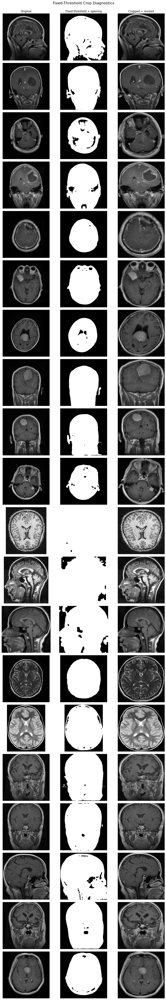

In [24]:
# Persist the existing fixed-threshold comparison for README and project reports.
preprocessing_output_dir = Path(r'C:\Users\pc\Desktop\MRI BRAIN TUMOR\preprocessing_diagnostics')
preprocessing_output_dir.mkdir(exist_ok=True)

fig, axes = plt.subplots(len(comparison_rows), 3, figsize=(11, 3 * len(comparison_rows)))
for row, item in enumerate(comparison_rows):
    axes[row, 0].imshow(item['Original'], cmap='gray')
    axes[row, 1].imshow(item['Thresholded'], cmap='gray')
    axes[row, 2].imshow(item['Processed'], cmap='gray')
    axes[row, 0].set_ylabel(item['Class'], fontsize=9)
    axes[row, 0].set_title('Original') if row == 0 else None
    axes[row, 1].set_title('Fixed threshold + opening') if row == 0 else None
    axes[row, 2].set_title('Cropped + resized') if row == 0 else None
    for axis in axes[row]:
        axis.axis('off')

fig.suptitle('Fixed-Threshold Crop Diagnostics', fontsize=16, y=1.0)
fig.tight_layout()
crop_comparison_path = preprocessing_output_dir / 'crop_comparison.png'
fig.savefig(crop_comparison_path, dpi=200, bbox_inches='tight')
assert crop_comparison_path.exists()
print(f'Saved preprocessing comparison: {crop_comparison_path}')
plt.show()
plt.close(fig)

Targeted noisy-image candidates:


,Class,Path,Noise Components,Old Component Count
6,notumor,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,4,5
3,meningioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,3,4
7,notumor,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,3,4


notumor: C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training\notumor\Tr-no_30.jpg
  Improved bounding box (x, y, w, h): (0, 0, 200, 210)
meningioma: C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training\meningioma\Tr-me_169.jpg
  Improved bounding box (x, y, w, h): (74, 62, 380, 450)
notumor: C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training\notumor\Tr-no_1101.jpg
  Improved bounding box (x, y, w, h): (0, 0, 236, 226)


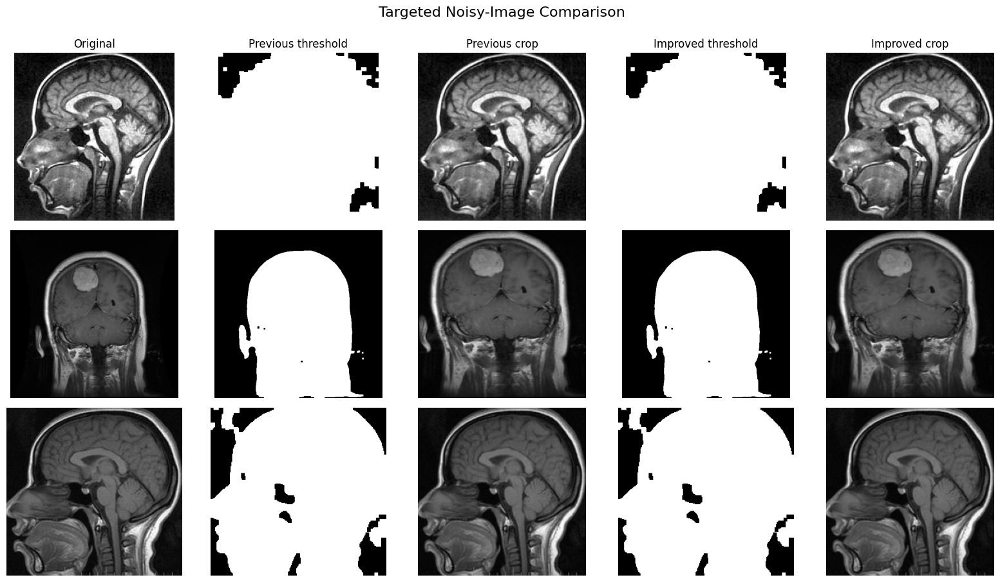

Fallbacks used during targeted recheck: 0


In [11]:
## Targeted Noisy-Image Recheck

# Rank the previous notumor/meningioma examples by disconnected components in the old mask.
noisy_candidates = []
for item in comparison_rows:
    if item['Class'] not in {'notumor', 'meningioma'}:
        continue
    component_count, _, component_stats, _ = cv2.connectedComponentsWithStats(
        item['Thresholded'], connectivity=8
    )
    component_areas = component_stats[1:, cv2.CC_STAT_AREA]
    noise_components = component_areas[component_areas < 0.01 * item['Original'].size]
    noisy_candidates.append({
        'Class': item['Class'],
        'Path': item['Path'],
        'Noise Components': len(noise_components),
        'Old Component Count': component_count - 1
    })

noisy_candidates_df = pd.DataFrame(noisy_candidates).sort_values(
    ['Noise Components', 'Old Component Count'], ascending=False
)
noisy_paths = noisy_candidates_df.head(3)['Path'].tolist()
print('Targeted noisy-image candidates:')
display(noisy_candidates_df.head(3))

fig, axes = plt.subplots(len(noisy_paths), 5, figsize=(16, 3 * len(noisy_paths)))
if len(noisy_paths) == 1:
    axes = np.expand_dims(axes, axis=0)

for row_number, image_path in enumerate(noisy_paths):
    old_item = next(item for item in comparison_rows if item['Path'] == image_path)
    improved_processed, improved_thresholded, improved_box = crop_and_resize_image(
        image_path, threshold_method='fixed', return_details=True
    )
    images = [
        old_item['Original'],
        old_item['Thresholded'],
        old_item['Processed'],
        improved_thresholded,
        improved_processed
    ]
    titles = [
        'Original',
        'Previous threshold',
        'Previous crop',
        'Improved threshold',
        'Improved crop'
    ]
    for column, (image, title) in enumerate(zip(images, titles)):
        axes[row_number, column].imshow(image, cmap='gray')
        axes[row_number, column].set_title(title if row_number == 0 else '')
        axes[row_number, column].axis('off')
    axes[row_number, 0].set_ylabel(old_item['Class'], fontsize=9)
    print(f'{old_item["Class"]}: {image_path}')
    print(f'  Improved bounding box (x, y, w, h): {improved_box}')

plt.suptitle('Targeted Noisy-Image Comparison', fontsize=16, y=1.0)
plt.tight_layout()
plt.show()
print(f'Fallbacks used during targeted recheck: {crop_fallback_count}')

In [12]:
# Inspect the two suspicious masks and the contours that currently survive filtering.
suspicious_paths = [
    'C:\\Users\\pc\\Desktop\\MRI BRAIN TUMOR\\archive\\Training\\notumor\\Tr-no_337.jpg',
    'C:\\Users\\pc\\Desktop\\MRI BRAIN TUMOR\\archive\\Training\\notumor\\Tr-no_30.jpg'
]

for image_path in suspicious_paths:
    grayscale_image = np.asarray(Image.open(image_path).convert('L'))
    blurred_image = cv2.GaussianBlur(grayscale_image, (5, 5), 0)
    _, diagnostic_mask = cv2.threshold(blurred_image, 15, 255, cv2.THRESH_BINARY)
    cleanup_kernel = np.ones((5, 5), dtype=np.uint8)
    diagnostic_mask = cv2.morphologyEx(diagnostic_mask, cv2.MORPH_OPEN, cleanup_kernel)
    diagnostic_mask = cv2.morphologyEx(diagnostic_mask, cv2.MORPH_CLOSE, cleanup_kernel)
    contours, _ = cv2.findContours(
        diagnostic_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    minimum_contour_area = 0.01 * grayscale_image.size
    valid_contours = [
        contour for contour in contours
        if cv2.contourArea(contour) >= minimum_contour_area
    ]
    if valid_contours:
        selected_contour = max(valid_contours, key=cv2.contourArea)
        x, y, width, height = cv2.boundingRect(selected_contour)
        bbox_mask = diagnostic_mask[y:y + height, x:x + width]
        foreground_fraction = (bbox_mask > 0).mean()
        print(f'Path: {image_path}')
        print(f'  Image shape: {grayscale_image.shape}')
        print(f'  Total foreground fraction: {(diagnostic_mask > 0).mean():.6f}')
        print(f'  Selected contour area: {cv2.contourArea(selected_contour):.1f}')
        print(f'  Bounding box: {(x, y, width, height)}')
        print(f'  Foreground fraction inside bounding box: {foreground_fraction:.6f}')
    else:
        print(f'Path: {image_path}')
        print('  No contour passed the minimum area filter.')

Path: C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training\notumor\Tr-no_337.jpg
  Image shape: (262, 227)
  Total foreground fraction: 0.998285
  Selected contour area: 58986.0
  Bounding box: (0, 0, 227, 262)
  Foreground fraction inside bounding box: 0.998285
Path: C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Training\notumor\Tr-no_30.jpg
  Image shape: (210, 200)
  Total foreground fraction: 0.907738
  Selected contour area: 37571.0
  Bounding box: (0, 0, 200, 210)
  Foreground fraction inside bounding box: 0.907738


In [13]:
# Distinguish a true fallback from a valid contour that covers the entire image.
print(f'Fallbacks used during targeted recheck: {crop_fallback_count}')
print(f'Valid full-image contours during targeted recheck: {full_image_bbox_count}')
for image_path in suspicious_paths:
    _, mask, bounding_box = crop_and_resize_image(
        image_path, threshold_method='fixed', return_details=True
    )
    print(
        f'{os.path.basename(image_path)}: '
        f'mask foreground={((mask > 0).mean()):.3f}, '
        f'bounding box={bounding_box}'
    )

Fallbacks used during targeted recheck: 0
Valid full-image contours during targeted recheck: 6
Tr-no_337.jpg: mask foreground=0.998, bounding box=(0, 0, 227, 262)
Tr-no_30.jpg: mask foreground=0.908, bounding box=(0, 0, 200, 210)


## Full-Dataset Preprocessing

An image is flagged as **minimal crop** when its selected bounding-box area covers more than 90% of the original image area. This captures cases where there is little or no removable background.

In [14]:
# Process every training and testing image with the validated pipeline.
all_data = pd.concat([training_data, testing_data], ignore_index=True)
crop_fallback_count = 0
full_image_bbox_count = 0
processed_arrays = []
processed_records = []

for image_number, row in enumerate(all_data.itertuples(index=False), start=1):
    original_image = np.asarray(Image.open(row[0]).convert('L'))
    processed_image, _, bounding_box = crop_and_resize_image(
        row[0], threshold_method='fixed', return_details=True
    )
    _, _, width, height = bounding_box
    original_height, original_width = original_image.shape
    bounding_box_area_ratio = (width * height) / (original_width * original_height)
    processed_arrays.append(processed_image)
    processed_records.append({
        'Class': row[1],
        'Class Path': row[0],
        'Original Width': original_width,
        'Original Height': original_height,
        'Bounding Box': bounding_box,
        'Bounding Box Area Ratio': bounding_box_area_ratio,
        'Minimal Crop': bounding_box_area_ratio > 0.90
    })
    if image_number % 1000 == 0:
        print(f'Processed {image_number}/{len(all_data)} images...')

processed_images = np.stack(processed_arrays).astype(np.uint8)
processed_metadata = pd.DataFrame(processed_records)

minimal_crop_summary = processed_metadata.groupby('Class').agg(
    Images=('Minimal Crop', 'size'),
    Minimal_Crop_Images=('Minimal Crop', 'sum'),
    Minimal_Crop_Fraction=('Minimal Crop', 'mean'),
    Mean_Bounding_Box_Area_Ratio=('Bounding Box Area Ratio', 'mean')
).reset_index()
minimal_crop_summary['Minimal_Crop_Percent'] = (
    100 * minimal_crop_summary['Minimal_Crop_Fraction']
).round(2)

print(f'Processed array shape: {processed_images.shape}')
print(f'True fallbacks: {crop_fallback_count}')
print(f'Valid full-image contours: {full_image_bbox_count}')
print('\nMinimal-crop summary (bounding-box area > 90% of original):')
display(minimal_crop_summary)

print('\nMinimal-crop percentage by class:')
for _, summary_row in minimal_crop_summary.iterrows():
    print(
        f"{summary_row['Class']}: "
        f"{summary_row['Minimal_Crop_Percent']:.2f}% "
        f"({int(summary_row['Minimal_Crop_Images'])}/{int(summary_row['Images'])})"
    )

Processed 1000/7200 images...
Processed 2000/7200 images...
Processed 3000/7200 images...
Processed 4000/7200 images...
Processed 5000/7200 images...
Processed 6000/7200 images...
Processed 7000/7200 images...
Processed array shape: (7200, 224, 224)
True fallbacks: 0
Valid full-image contours: 516

Minimal-crop summary (bounding-box area > 90% of original):


,Class,Images,Minimal_Crop_Images,Minimal_Crop_Fraction,Mean_Bounding_Box_Area_Ratio,Minimal_Crop_Percent
0,glioma,1800,67,0.037222,0.621206,3.72
1,meningioma,1800,137,0.076111,0.660965,7.61
2,notumor,1800,555,0.308333,0.774939,30.83
3,pituitary,1800,485,0.269444,0.815990,26.94



Minimal-crop percentage by class:
glioma: 3.72% (67/1800)
meningioma: 7.61% (137/1800)
notumor: 30.83% (555/1800)
pituitary: 26.94% (485/1800)


In [15]:
# Save the processed image tensor and metadata so preprocessing is not repeated.
processed_images_path = 'processed_images.npy'
processed_metadata_path = 'processed_metadata.csv'

np.save(processed_images_path, processed_images)
processed_metadata.to_csv(processed_metadata_path, index=False)

print(f'Saved processed images to: {processed_images_path}')
print(f'Saved processed metadata to: {processed_metadata_path}')
print(f'Image file size: {os.path.getsize(processed_images_path) / (1024 ** 2):.1f} MB')
print(f'Metadata file size: {os.path.getsize(processed_metadata_path) / 1024:.1f} KB')

Saved processed images to: processed_images.npy
Saved processed metadata to: processed_metadata.csv
Image file size: 344.5 MB
Metadata file size: 965.3 KB


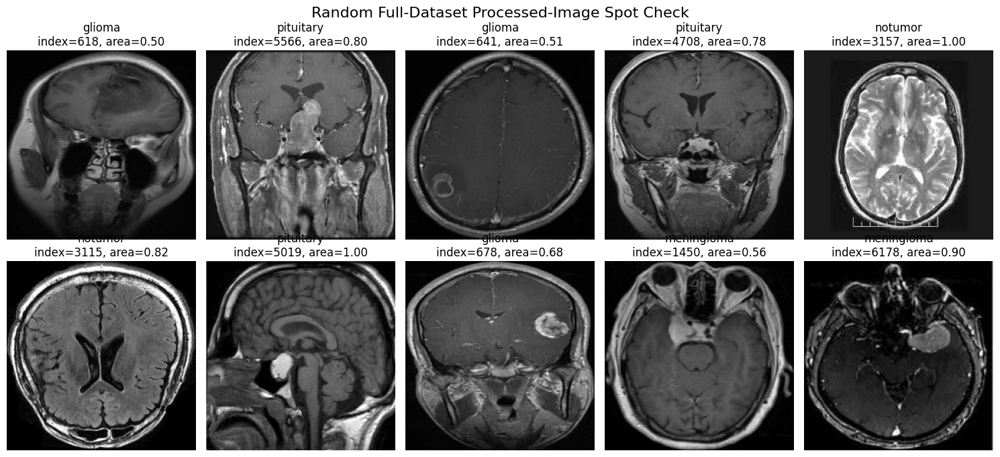

,Class,Class Path,Bounding Box Area Ratio,Minimal Crop
618,glioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.499344,False
5566,pituitary,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.797965,False
641,glioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.511600,False
4708,pituitary,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.781250,False
3157,notumor,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,1.000000,True
3115,notumor,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.817757,False
5019,pituitary,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,1.000000,True
678,glioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.679253,False
1450,meningioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...,0.555672,False
6178,meningioma,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Te...,0.899372,False


In [16]:
# Final visual spot check using a random sample from the complete processed tensor.
rng = np.random.default_rng(42)
spot_check_indices = rng.choice(len(processed_images), size=10, replace=False)
spot_check_metadata = processed_metadata.iloc[spot_check_indices].copy()

fig, axes = plt.subplots(2, 5, figsize=(15, 7))
for axis, image_index in zip(axes.ravel(), spot_check_indices):
    axis.imshow(processed_images[image_index], cmap='gray')
    image_class = processed_metadata.iloc[image_index]['Class']
    crop_ratio = processed_metadata.iloc[image_index]['Bounding Box Area Ratio']
    axis.set_title(f'{image_class}\nindex={image_index}, area={crop_ratio:.2f}')
    axis.axis('off')

plt.suptitle('Random Full-Dataset Processed-Image Spot Check', fontsize=16)
plt.tight_layout()
plt.show()

display(spot_check_metadata[['Class', 'Class Path', 'Bounding Box Area Ratio', 'Minimal Crop']])

In [17]:
# Confirm that processed arrays and metadata remain row-aligned and fully labeled.
assert len(processed_images) == len(processed_metadata)
assert processed_metadata['Class'].isna().sum() == 0
print('Integrity check passed: arrays and metadata are aligned and all samples have labels.')

Integrity check passed: arrays and metadata are aligned and all samples have labels.


## Train, Validation, and Test Split

Recover the original `Training`/`Testing` boundary first, then split only the original training pool into stratified train and validation subsets.

In [18]:
# Recover the original dataset boundary from each source path.
processed_metadata['Split'] = processed_metadata['Class Path'].apply(
    lambda path: 'Testing' if 'Testing' in path else 'Training'
)

training_indices = np.flatnonzero(processed_metadata['Split'].eq('Training').to_numpy())
testing_indices = np.flatnonzero(processed_metadata['Split'].eq('Testing').to_numpy())

assert len(training_indices) == len(training_data)
assert len(testing_indices) == len(testing_data)
assert set(training_indices).isdisjoint(testing_indices)

training_pool_metadata = processed_metadata.iloc[training_indices].reset_index(drop=True)
test_metadata = processed_metadata.iloc[testing_indices].reset_index(drop=True)
training_pool_images = processed_images[training_indices]
test_images = processed_images[testing_indices]

print(f'Training pool: {len(training_pool_metadata)} images')
print(f'Untouched test set: {len(test_metadata)} images')
print('\nTraining pool class counts:')
print(training_pool_metadata['Class'].value_counts().sort_index())
print('\nTest class counts:')
print(test_metadata['Class'].value_counts().sort_index())

Training pool: 5600 images
Untouched test set: 1600 images

Training pool class counts:
Class
glioma        1400
meningioma    1400
notumor       1400
pituitary     1400
Name: count, dtype: int64

Test class counts:
Class
glioma        400
meningioma    400
notumor       400
pituitary     400
Name: count, dtype: int64


In [19]:
# Split only the original training pool by index, preserving class proportions.
training_pool_labels_text = training_pool_metadata['Class'].to_numpy()
training_pool_positions = np.arange(len(training_pool_metadata))

train_positions, validation_positions = train_test_split(
    training_pool_positions,
    test_size=0.20,
    random_state=42,
    stratify=training_pool_labels_text
)

label_encoder = LabelEncoder()
training_pool_labels = label_encoder.fit_transform(training_pool_labels_text)
class_names = label_encoder.classes_.tolist()
index_to_class = dict(enumerate(class_names))

train_images = training_pool_images[train_positions]
validation_images = training_pool_images[validation_positions]
train_labels = training_pool_labels[train_positions]
validation_labels = training_pool_labels[validation_positions]
test_labels = label_encoder.transform(test_metadata['Class'].to_numpy())

train_metadata = training_pool_metadata.iloc[train_positions].reset_index(drop=True)
validation_metadata = training_pool_metadata.iloc[validation_positions].reset_index(drop=True)

print(f'Train split: {len(train_images)} images')
print(f'Validation split: {len(validation_images)} images')
print(f'Test split: {len(test_images)} images')
print(f'Class mapping (index -> class): {index_to_class}')
print('\nTrain class counts:')
print(pd.Series(train_labels).value_counts().sort_index().rename(index=index_to_class))
print('\nValidation class counts:')
print(pd.Series(validation_labels).value_counts().sort_index().rename(index=index_to_class))

Train split: 4480 images
Validation split: 1120 images
Test split: 1600 images
Class mapping (index -> class): {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}

Train class counts:
glioma        1120
meningioma    1120
notumor       1120
pituitary     1120
Name: count, dtype: int64

Validation class counts:
glioma        280
meningioma    280
notumor       280
pituitary     280
Name: count, dtype: int64


In [20]:
# Build tf.data pipelines from the processed NumPy arrays.
batch_size = 8
train_images_with_channel = train_images[..., np.newaxis]
validation_images_with_channel = validation_images[..., np.newaxis]
test_images_with_channel = test_images[..., np.newaxis]

augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.05, fill_mode='constant', fill_value=0.0),
    tf.keras.layers.RandomZoom(
        height_factor=0.10,
        width_factor=0.10,
        fill_mode='constant',
        fill_value=0.0
    )
], name='training_augmentation')


def normalize_image(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label


def augment_and_normalize_image(image, label):
    image, label = normalize_image(image, label)
    return augmentation(image, training=True), label


train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_images_with_channel, train_labels)
).shuffle(len(train_images_with_channel), seed=42, reshuffle_each_iteration=True)
train_dataset = train_dataset.map(
    augment_and_normalize_image, num_parallel_calls=tf.data.AUTOTUNE
).batch(batch_size).prefetch(tf.data.AUTOTUNE)

validation_dataset = tf.data.Dataset.from_tensor_slices(
    (validation_images_with_channel, validation_labels)
).map(
    normalize_image, num_parallel_calls=tf.data.AUTOTUNE
).batch(batch_size).prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices(
    (test_images_with_channel, test_labels)
).map(
    normalize_image, num_parallel_calls=tf.data.AUTOTUNE
).batch(batch_size).prefetch(tf.data.AUTOTUNE)

class_mapping_df = pd.DataFrame({
    'Class Index': list(index_to_class.keys()),
    'Class Name': list(index_to_class.values())
})
class_mapping_df.to_csv('class_mapping.csv', index=False)

sample_batch_images, sample_batch_labels = next(iter(train_dataset))
print(f'Train batch image shape: {sample_batch_images.shape}')
print(f'Train batch label shape: {sample_batch_labels.shape}')
print(f'Image value range after normalization: {float(tf.reduce_min(sample_batch_images)):.3f} to {float(tf.reduce_max(sample_batch_images)):.3f}')
print('Saved class mapping to: class_mapping.csv')

Train batch image shape: (8, 224, 224, 1)
Train batch label shape: (8,)
Image value range after normalization: 0.000 to 0.954
Saved class mapping to: class_mapping.csv


In [21]:
# Persist the exact split arrays for reuse by the baseline CNN notebook.
np.save('train_images.npy', train_images)
np.save('validation_images.npy', validation_images)
np.save('test_images.npy', test_images)
np.save('train_labels.npy', train_labels)
np.save('validation_labels.npy', validation_labels)
np.save('test_labels.npy', test_labels)

assert set(train_positions).isdisjoint(validation_positions)
assert len(train_images) == len(train_labels)
assert len(validation_images) == len(validation_labels)
assert len(test_images) == len(test_labels)

print('Saved train, validation, and test arrays and labels.')
print('Train/validation positions are disjoint.')

Saved train, validation, and test arrays and labels.
Train/validation positions are disjoint.


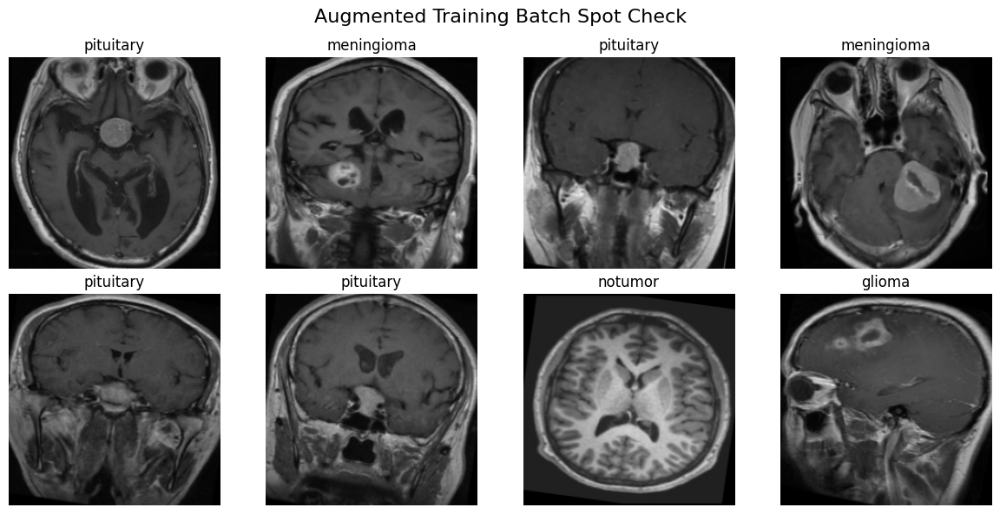

Augmented batch shape: (8, 224, 224, 1)


In [22]:
# Inspect a few augmented training images from one real dataset batch.
augmented_batch_images, augmented_batch_labels = next(iter(train_dataset))
images_to_plot = min(8, len(augmented_batch_images))

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for axis, image, label in zip(
    axes.ravel(),
    augmented_batch_images[:images_to_plot],
    augmented_batch_labels[:images_to_plot]
):
    axis.imshow(tf.squeeze(image), cmap='gray', vmin=0, vmax=1)
    axis.set_title(index_to_class[int(label)])
    axis.axis('off')

for axis in axes.ravel()[images_to_plot:]:
    axis.axis('off')

plt.suptitle('Augmented Training Batch Spot Check', fontsize=16)
plt.tight_layout()
plt.show()
print(f'Augmented batch shape: {augmented_batch_images.shape}')

## Baseline CNN

A four-block grayscale CNN with global average pooling and a four-class softmax head. Training uses sparse integer labels, early stopping, and validation-loss learning-rate reduction.

In [8]:
# Make model initialization, augmentation, and dataset operations reproducible.
tf.keras.utils.set_random_seed(42)
print('Global random seed set to 42.')

Global random seed set to 42.


In [23]:
# Baseline CNN: four convolutional blocks with a global-average-pooling head.
import numpy as np
import pandas as pd
import tensorflow as tf

train_images = np.load('train_images.npy')
validation_images = np.load('validation_images.npy')
train_labels = np.load('train_labels.npy')
validation_labels = np.load('validation_labels.npy')
class_mapping_df = pd.read_csv('class_mapping.csv')
class_names = class_mapping_df.sort_values('Class Index')['Class Name'].tolist()

train_images_with_channel = train_images[..., np.newaxis]
validation_images_with_channel = validation_images[..., np.newaxis]

augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.05, fill_mode='constant', fill_value=0.0),
    tf.keras.layers.RandomZoom(
        height_factor=0.10,
        width_factor=0.10,
        fill_mode='constant',
        fill_value=0.0
    )
], name='training_augmentation')


def normalize_image(image, label):
    return tf.cast(image, tf.float32) / 255.0, label


def augment_and_normalize_image(image, label):
    image, label = normalize_image(image, label)
    return augmentation(image, training=True), label


low_memory_batch_size = 8
train_dataset_low_memory = tf.data.Dataset.from_tensor_slices(
    (train_images_with_channel, train_labels)
).shuffle(
    len(train_images_with_channel), seed=42, reshuffle_each_iteration=True
).map(
    augment_and_normalize_image, num_parallel_calls=1
).batch(low_memory_batch_size).prefetch(1)

validation_dataset_low_memory = tf.data.Dataset.from_tensor_slices(
    (validation_images_with_channel, validation_labels)
).map(
    normalize_image, num_parallel_calls=1
).batch(low_memory_batch_size).prefetch(1)

baseline_cnn = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(224, 224, 1)),
    tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(128, 3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(256, 3, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(len(class_names), activation='softmax')
], name='baseline_cnn')

baseline_cnn.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

baseline_cnn_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3
    )
]

baseline_cnn.summary()
baseline_history = baseline_cnn.fit(
    train_dataset_low_memory,
    validation_data=validation_dataset_low_memory,
    epochs=40,
    callbacks=baseline_cnn_callbacks
)

baseline_cnn.save('baseline_cnn.keras')
print('Saved trained baseline CNN to baseline_cnn.keras')

Model: "baseline_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 423,172 (1.61 MB)

 Trainable params: 422,212 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 116s 202ms/step - accuracy: 0.5978 - loss: 0.9449 - val_accuracy: 0.4009 - val_loss: 5.9376 - learning_rate: 0.0010
Epoch 2/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 117s 208ms/step - accuracy: 0.7089 - loss: 0.7296 - val_accuracy: 0.5268 - val_loss: 1.2976 - learning_rate: 0.0010
Epoch 3/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 119s 212ms/step - accuracy: 0.7578 - loss: 0.6212 - val_accuracy: 0.3580 - val_loss: 2.3696 - learning_rate: 0.0010
Epoch 4/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 118s 210ms/step - accuracy: 0.7964 - loss: 0.5474 - val_accuracy: 0.5973 - val_loss: 1.0942 - learning_rate: 0.0010
Epoch 5/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 120s 213ms/step - accuracy: 0.8203 - loss: 0.4822 - val_accuracy: 0.7786 - val_loss: 0.5490 - learning_rate: 0.0010
Epoch 6/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 121s 216ms/step - accuracy: 0.8391 - loss: 0.4305 - val_accuracy: 0.5214 - val_loss: 2.8515 - learning_rate: 0.0010
Epoch 7/40
560/560 ━━━━━━━━━━━━━━━━━━━━ 121s 215ms/step - accura

In [24]:
# Save epoch-by-epoch training history for later analysis.
import json

with open('baseline_history.json', 'w') as history_file:
    json.dump(baseline_history.history, history_file)

print('Saved baseline training history to baseline_history.json')

Saved baseline training history to baseline_history.json


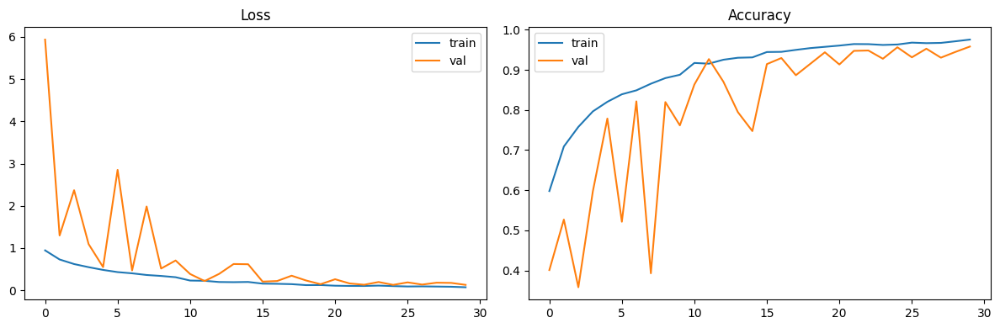

In [25]:
# Plot baseline training and validation curves.
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(baseline_history.history['loss'], label='train')
axes[0].plot(baseline_history.history['val_loss'], label='val')
axes[0].set_title('Loss')
axes[0].legend()

axes[1].plot(baseline_history.history['accuracy'], label='train')
axes[1].plot(baseline_history.history['val_accuracy'], label='val')
axes[1].set_title('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

In [1]:
# Evaluate the baseline CNN on validation data only.
from sklearn.metrics import classification_report, confusion_matrix

validation_predictions = baseline_cnn.predict(validation_dataset_low_memory)
validation_predicted_labels = np.argmax(validation_predictions, axis=1)

print('Validation classification report:')
print(classification_report(
    validation_labels,
    validation_predicted_labels,
    target_names=class_names,
    digits=4
))

print('Validation confusion matrix:')
print(confusion_matrix(validation_labels, validation_predicted_labels))

NameError: name 'baseline_cnn' is not defined

## Transfer Learning with EfficientNetB0

Reload the saved data as three-channel images, use EfficientNet preprocessing, and train a new classification head on a frozen ImageNet backbone.

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf

train_images = np.load('train_images.npy')
validation_images = np.load('validation_images.npy')
train_labels = np.load('train_labels.npy')
validation_labels = np.load('validation_labels.npy')

class_mapping_df = pd.read_csv('class_mapping.csv')
class_names = class_mapping_df.sort_values('Class Index')['Class Name'].tolist()

# EfficientNet expects three input channels, so repeat the grayscale channel.
train_images_3ch = np.repeat(train_images[..., np.newaxis], 3, axis=-1)
validation_images_3ch = np.repeat(validation_images[..., np.newaxis], 3, axis=-1)

print(f'Train shape: {train_images_3ch.shape}')
print(f'Validation shape: {validation_images_3ch.shape}')
print(f'Classes: {class_names}')

C:\Users\pc\AppData\Roaming\Python\Python310\site-packages\google\api_core\_python_version_support.py:273: FutureWarning: You are using a Python version (3.10.0) which Google will stop supporting in new releases of google.api_core once it reaches its end of life (2026-10-04). Please upgrade to the latest Python version, or at least Python 3.11, to continue receiving updates for google.api_core past that date.
  warnings.warn(message, FutureWarning)


Train shape: (4480, 224, 224, 3)
Validation shape: (1120, 224, 224, 3)
Classes: ['glioma', 'meningioma', 'notumor', 'pituitary']


In [2]:
from tensorflow.keras.applications.efficientnet import preprocess_input

# Keep this cell runnable independently of the baseline CNN section.
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.05, fill_mode='constant', fill_value=0.0),
    tf.keras.layers.RandomZoom(
        height_factor=0.10,
        width_factor=0.10,
        fill_mode='constant',
        fill_value=0.0
    )
], name='transfer_training_augmentation')


def normalize_image(image, label):
    return preprocess_input(tf.cast(image, tf.float32)), label


def augment_and_normalize_image(image, label):
    image = augmentation(tf.cast(image, tf.float32), training=True)
    return preprocess_input(image), label

low_memory_batch_size = 8
transfer_train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_images_3ch, train_labels)
).shuffle(
    len(train_images_3ch), seed=42, reshuffle_each_iteration=True
).map(
    augment_and_normalize_image, num_parallel_calls=1
).batch(low_memory_batch_size).prefetch(1)

transfer_validation_dataset = tf.data.Dataset.from_tensor_slices(
    (validation_images_3ch, validation_labels)
).map(
    normalize_image, num_parallel_calls=1
).batch(low_memory_batch_size).prefetch(1)

print('Transfer-learning datasets are ready.')

Transfer-learning datasets are ready.


In [3]:
from tensorflow.keras.applications import EfficientNetB0

base_model = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)
base_model.trainable = False

transfer_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(224, 224, 3)),
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(len(class_names), activation='softmax')
], name='efficientnet_transfer')

transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

transfer_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3
    )
]

transfer_model.summary()
transfer_history = transfer_model.fit(
    transfer_train_dataset,
    validation_data=transfer_validation_dataset,
    epochs=30,
    callbacks=transfer_callbacks
)

transfer_model.save('efficientnet_frozen.keras')
print('Saved frozen-backbone transfer model to efficientnet_frozen.keras')


Model: "efficientnet_transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,055 (16.08 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

Epoch 1/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - accuracy: 0.7835 - loss: 0.5671 - val_accuracy: 0.7295 - val_loss: 0.7588 - learning_rate: 0.0010
Epoch 2/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - accuracy: 0.8382 - loss: 0.4146 - val_accuracy: 0.8295 - val_loss: 0.4388 - learning_rate: 0.0010
Epoch 3/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - accuracy: 0.8594 - loss: 0.3775 - val_accuracy: 0.8571 - val_loss: 0.3982 - learning_rate: 0.0010
Epoch 4/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 60s 106ms/step - accuracy: 0.8658 - loss: 0.3560 - val_accuracy: 0.8670 - val_loss: 0.3485 - learning_rate: 0.0010
Epoch 5/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 63s 113ms/step - accuracy: 0.8672 - loss: 0.3417 - val_accuracy: 0.8393 - val_loss: 0.4719 - learning_rate: 0.0010
Epoch 6/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - accuracy: 0.8804 - loss: 0.3138 - val_accuracy: 0.8625 - val_loss: 0.3650 - learning_rate: 0.0010
Epoch 7/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - accuracy: 0.8786

In [4]:
import json
import os

# Start from a saved frozen-backbone checkpoint when available; otherwise build one from the current model.
checkpoint_path = 'efficientnet_frozen.keras'
if os.path.exists(checkpoint_path):
    transfer_model = tf.keras.models.load_model(checkpoint_path)
    print(f'Loaded frozen-backbone model from {checkpoint_path}')
else:
    # Rebuild a fresh frozen-backbone model from the transfer-learning setup above.
    from tensorflow.keras.applications import EfficientNetB0
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(224, 224, 3)
    )
    base_model.trainable = False
    transfer_model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(224, 224, 3)),
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(len(class_names), activation='softmax')
    ], name='efficientnet_transfer')
    transfer_model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-3),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    print(f'Checkpoint {checkpoint_path} not found; rebuilt fresh frozen backbone model.')

base_model = transfer_model.get_layer('efficientnetb0')
print('Loaded frozen-backbone model and history checkpoint.')
base_model.trainable = True

# Keep early layers frozen, only fine-tune the later ones.
for layer in base_model.layers[:-30]:
    layer.trainable = False

transfer_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3
    )
]

transfer_model.summary()
fine_tune_history = transfer_model.fit(
    transfer_train_dataset,
    validation_data=transfer_validation_dataset,
    epochs=30,
    callbacks=fine_tune_callbacks
)
transfer_model.save('efficientnet_finetuned.keras')
with open('transfer_finetuned_history.json', 'w') as f:
    json.dump(fine_tune_history.history, f)

print('Saved fine-tuned model and history.')
from sklearn.metrics import classification_report, confusion_matrix

validation_predictions = transfer_model.predict(transfer_validation_dataset)
validation_predicted_labels = np.argmax(validation_predictions, axis=1)

print('Validation classification report:')
print(classification_report(
    validation_labels,
    validation_predicted_labels,
    target_names=class_names,
    digits=4
))

print('Validation confusion matrix:')
print(confusion_matrix(validation_labels, validation_predicted_labels))


Loaded frozen-backbone model from efficientnet_frozen.keras
Loaded frozen-backbone model and history checkpoint.


Model: "efficientnet_transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,055 (16.08 MB)

 Trainable params: 1,660,644 (6.33 MB)

 Non-trainable params: 2,553,411 (9.74 MB)

Epoch 1/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 69s 110ms/step - accuracy: 0.7415 - loss: 0.7223 - val_accuracy: 0.8652 - val_loss: 0.3928 - learning_rate: 1.0000e-05
Epoch 2/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 64s 114ms/step - accuracy: 0.7984 - loss: 0.5522 - val_accuracy: 0.8661 - val_loss: 0.3612 - learning_rate: 1.0000e-05
Epoch 3/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 66s 118ms/step - accuracy: 0.8172 - loss: 0.4963 - val_accuracy: 0.8705 - val_loss: 0.3422 - learning_rate: 1.0000e-05
Epoch 4/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 67s 119ms/step - accuracy: 0.8308 - loss: 0.4529 - val_accuracy: 0.8804 - val_loss: 0.3157 - learning_rate: 1.0000e-05
Epoch 5/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 76s 135ms/step - accuracy: 0.8444 - loss: 0.4161 - val_accuracy: 0.8875 - val_loss: 0.3054 - learning_rate: 1.0000e-05
Epoch 6/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 70s 125ms/step - accuracy: 0.8614 - loss: 0.3548 - val_accuracy: 0.8884 - val_loss: 0.3032 - learning_rate: 1.0000e-05
Epoch 7/30
560/560 ━━━━━━━━━━━━━━━━━━━━ 74s 13

## Grad-CAM Analysis

Visualize where the fine-tuned EfficientNetB0 focuses on correctly classified and misclassified validation images, including meningioma crop-ratio comparisons.

In [5]:
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Reload the saved fine-tuned model so Grad-CAM uses the final 30-epoch checkpoint.
transfer_model = tf.keras.models.load_model('efficientnet_finetuned.keras')
base_model = transfer_model.get_layer('efficientnetb0')
classifier_layers = [
    layer for layer in transfer_model.layers if layer.name != base_model.name
]

# Find the last spatial convolutional feature map available in this EfficientNet build.
conv_layer_names = [
    layer.name for layer in base_model.layers
    if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.DepthwiseConv2D))
    and len(layer.output.shape) == 4
]
preferred_layer_names = ['top_conv', 'top_activation']
target_layer_name = next(
    (name for name in preferred_layer_names if name in conv_layer_names),
    conv_layer_names[-1]
)
target_layer = base_model.get_layer(target_layer_name)
grad_model = tf.keras.models.Model(
    base_model.inputs,
    [target_layer.output, base_model.output]
)

print(f'Grad-CAM target layer: {target_layer_name}')
print(f'Final convolutional candidates: {conv_layer_names[-5:]}')

# Recreate the exact validation metadata from the saved preprocessing table.
processed_metadata_for_cam = pd.read_csv('processed_metadata.csv')
processed_metadata_for_cam['Split'] = processed_metadata_for_cam['Class Path'].map(
    lambda path: 'Testing' if 'Testing' in path else 'Training'
)
training_metadata_for_cam = processed_metadata_for_cam[
    processed_metadata_for_cam['Split'].eq('Training')
].reset_index(drop=True)
training_positions_for_cam = np.arange(len(training_metadata_for_cam))
_, validation_positions_for_cam = train_test_split(
    training_positions_for_cam,
    test_size=0.20,
    random_state=42,
    stratify=training_metadata_for_cam['Class'].to_numpy()
)
validation_metadata_for_cam = training_metadata_for_cam.iloc[
    validation_positions_for_cam
].reset_index(drop=True)

# Match labels, images, and metadata by the validation ordering used during training.
assert len(validation_metadata_for_cam) == len(validation_images)
assert np.array_equal(
    validation_metadata_for_cam['Class'].to_numpy(),
    np.asarray([class_names[int(label)] for label in validation_labels])
)

validation_cam_inputs = preprocess_input(
    tf.cast(validation_images_3ch, tf.float32)
)
validation_cam_predictions = transfer_model.predict(
    validation_cam_inputs, batch_size=8, verbose=0
)
validation_cam_predicted_labels = np.argmax(validation_cam_predictions, axis=1)


def make_gradcam_heatmap(image_tensor, class_index=None):
    image_batch = tf.expand_dims(image_tensor, axis=0)
    with tf.GradientTape() as tape:
        conv_outputs, features = grad_model(image_batch, training=False)
        tape.watch(conv_outputs)
        predictions = features
        for layer in classifier_layers:
            predictions = layer(predictions, training=False)
        if class_index is None:
            class_index = tf.argmax(predictions[0])
        class_score = predictions[:, class_index]

    gradients = tape.gradient(class_score, conv_outputs)
    channel_weights = tf.reduce_mean(gradients, axis=(1, 2))
    heatmap = tf.reduce_sum(conv_outputs * channel_weights[:, tf.newaxis, tf.newaxis, :], axis=-1)
    heatmap = tf.maximum(heatmap, 0)[0]
    heatmap = heatmap / (tf.reduce_max(heatmap) + tf.keras.backend.epsilon())
    heatmap = tf.image.resize(heatmap[..., tf.newaxis], (224, 224))[..., 0]
    return heatmap.numpy()


def render_gradcam(index, title):
    image = validation_images[index]
    heatmap = make_gradcam_heatmap(
        validation_cam_inputs[index],
        int(validation_cam_predicted_labels[index])
    )
    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    overlay = cv2.addWeighted(image_rgb, 0.60, heatmap_color, 0.40, 0)
    true_name = class_names[int(validation_labels[index])]
    predicted_name = class_names[int(validation_cam_predicted_labels[index])]
    crop_ratio = validation_metadata_for_cam.iloc[index]['Bounding Box Area Ratio']

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Processed image')
    axes[1].imshow(heatmap, cmap='jet', vmin=0, vmax=1)
    axes[1].set_title('Grad-CAM heatmap')
    axes[2].imshow(overlay)
    axes[2].set_title('Overlay')
    for axis in axes:
        axis.axis('off')
    fig.suptitle(
        f'{title}\ntrue={true_name}, predicted={predicted_name}, '
        f'crop area ratio={crop_ratio:.3f}',
        fontsize=12
    )
    plt.tight_layout()
    plt.show()

    return {
        'index': index,
        'true': true_name,
        'predicted': predicted_name,
        'crop_area_ratio': float(crop_ratio)
    }

print('Grad-CAM model and validation metadata are ready.')

Grad-CAM target layer: top_conv
Final convolutional candidates: ['block7a_dwconv', 'block7a_se_reduce', 'block7a_se_expand', 'block7a_project_conv', 'top_conv']
Grad-CAM model and validation metadata are ready.


Correct meningioma examples: 240
Meningioma mistakes by predicted class:
meningioma    240
pituitary      27
glioma         10
notumor         3
Name: count, dtype: int64
Correct notumor examples: 277


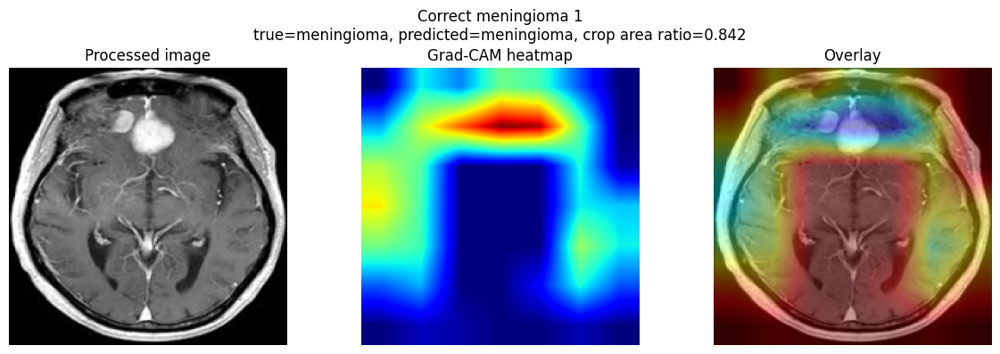

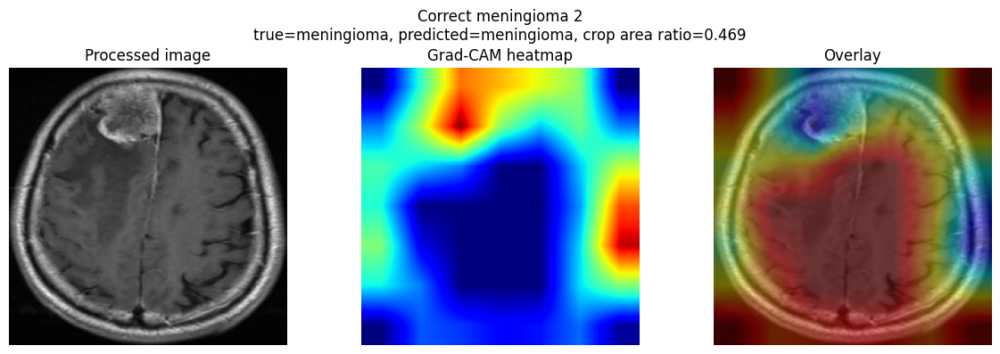

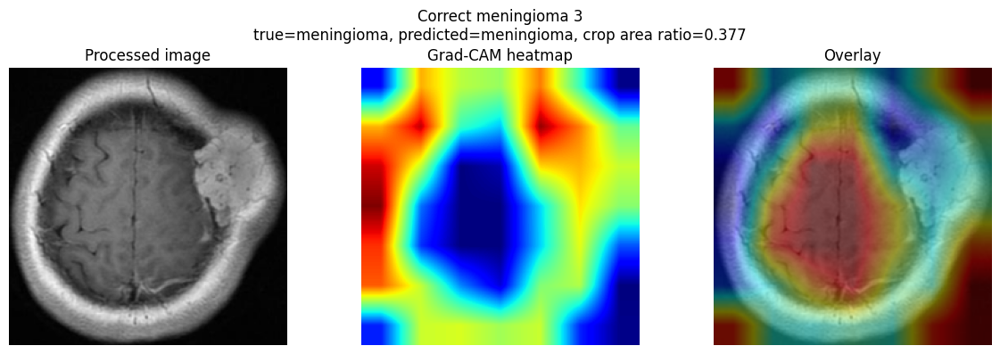

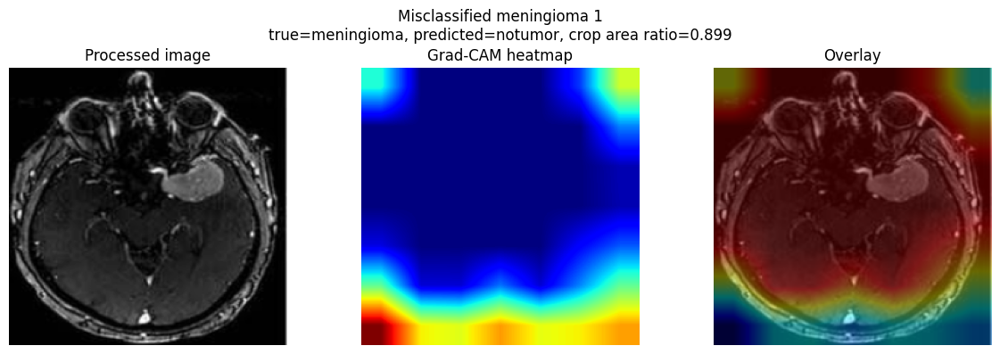

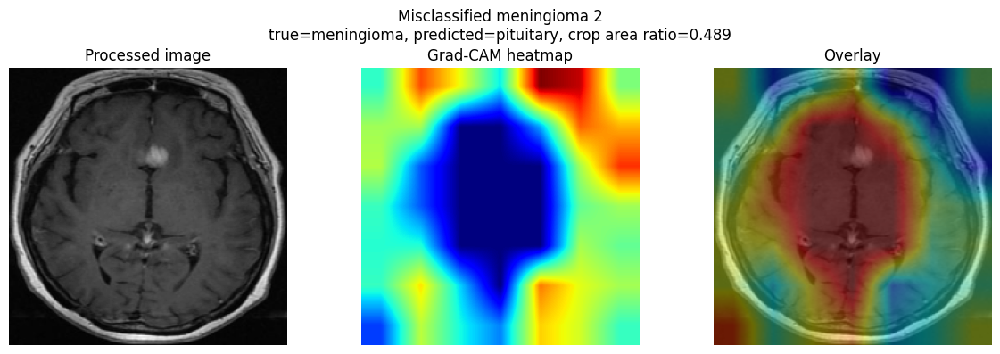

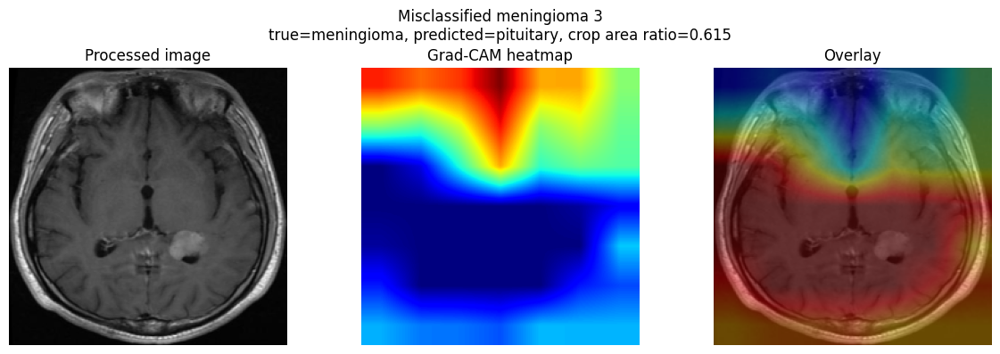

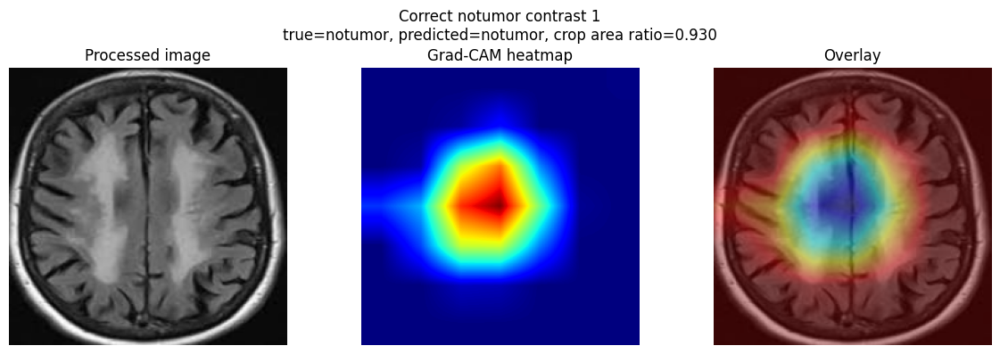

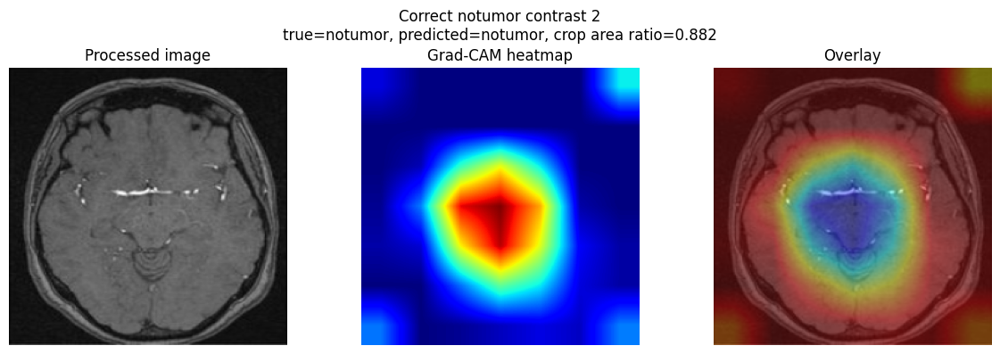

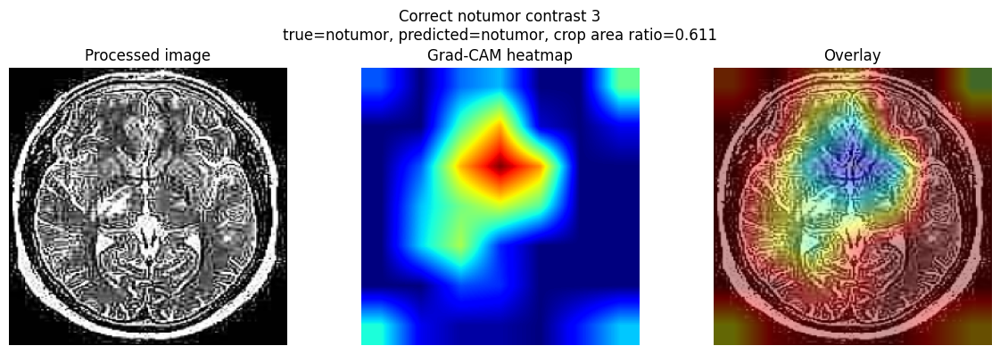

Meningioma crop-ratio comparison:


,Group,Index,True class,Predicted class,Bounding-box area ratio,Class Path
0,Low crop area ratio (more background removed),757,meningioma,meningioma,0.304092,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...
1,High crop area ratio (minimal crop),359,meningioma,meningioma,1.000000,C:\Users\pc\Desktop\MRI BRAIN TUMOR\archive\Tr...


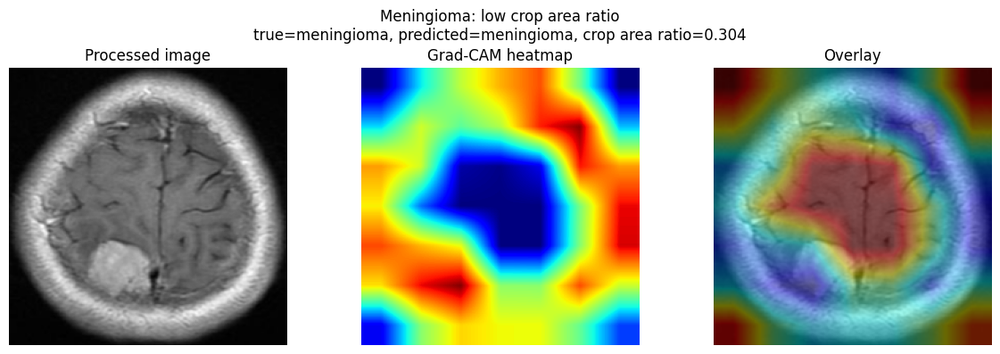

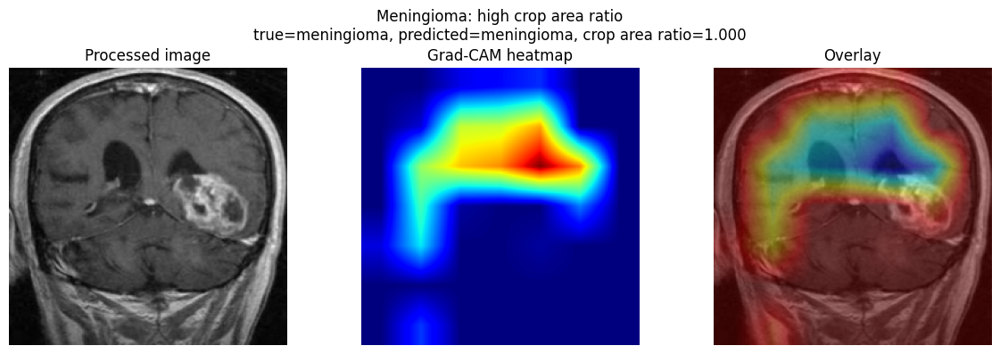

{'index': 359,
 'true': 'meningioma',
 'predicted': 'meningioma',
 'crop_area_ratio': 1.0}

In [6]:
true_names = np.asarray([class_names[int(label)] for label in validation_labels])
predicted_names = np.asarray([
    class_names[int(label)] for label in validation_cam_predicted_labels
])

correct_meningioma_indices = np.flatnonzero(
    (true_names == 'meningioma') & (predicted_names == 'meningioma')
)
misclassified_meningioma_indices = np.flatnonzero(
    (true_names == 'meningioma') & (predicted_names != 'meningioma')
)
correct_notumor_indices = np.flatnonzero(
    (true_names == 'notumor') & (predicted_names == 'notumor')
)

print(f'Correct meningioma examples: {len(correct_meningioma_indices)}')
print('Meningioma mistakes by predicted class:')
print(pd.Series(predicted_names[true_names == 'meningioma']).value_counts())
print(f'Correct notumor examples: {len(correct_notumor_indices)}')

# Show purposeful examples from each requested group.
selected_groups = {
    'Correct meningioma': correct_meningioma_indices[:3],
    'Misclassified meningioma': misclassified_meningioma_indices[:3],
    'Correct notumor contrast': correct_notumor_indices[:3]
}
for group_name, indices in selected_groups.items():
    for example_number, index in enumerate(indices, start=1):
        render_gradcam(int(index), f'{group_name} {example_number}')

# Compare meningioma examples with the most and least cropped background.
meningioma_indices = np.flatnonzero(true_names == 'meningioma')
meningioma_ratios = validation_metadata_for_cam.iloc[
    meningioma_indices
]['Bounding Box Area Ratio'].to_numpy()
low_crop_index = int(meningioma_indices[np.argmin(meningioma_ratios)])
high_crop_index = int(meningioma_indices[np.argmax(meningioma_ratios)])

crop_comparison = pd.DataFrame([
    {
        'Group': 'Low crop area ratio (more background removed)',
        'Index': low_crop_index,
        'True class': true_names[low_crop_index],
        'Predicted class': predicted_names[low_crop_index],
        'Bounding-box area ratio': meningioma_ratios.min(),
        'Class Path': validation_metadata_for_cam.iloc[low_crop_index]['Class Path']
    },
    {
        'Group': 'High crop area ratio (minimal crop)',
        'Index': high_crop_index,
        'True class': true_names[high_crop_index],
        'Predicted class': predicted_names[high_crop_index],
        'Bounding-box area ratio': meningioma_ratios.max(),
        'Class Path': validation_metadata_for_cam.iloc[high_crop_index]['Class Path']
    }
])
print('Meningioma crop-ratio comparison:')
display(crop_comparison)

render_gradcam(low_crop_index, 'Meningioma: low crop area ratio')
render_gradcam(high_crop_index, 'Meningioma: high crop area ratio')

Additional misclassified meningioma examples selected: 5
Saved figure: gradcam_figures\misclassified_meningioma_0069_additional_misclassified_meningioma_1.png


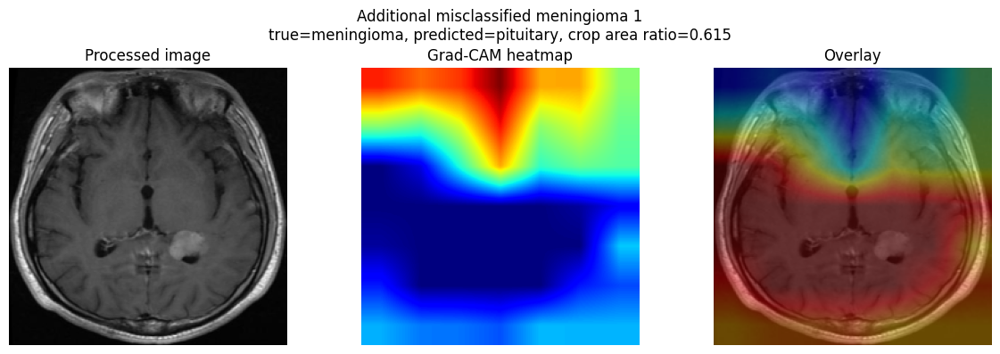

Saved figure: gradcam_figures\misclassified_meningioma_0146_additional_misclassified_meningioma_2.png


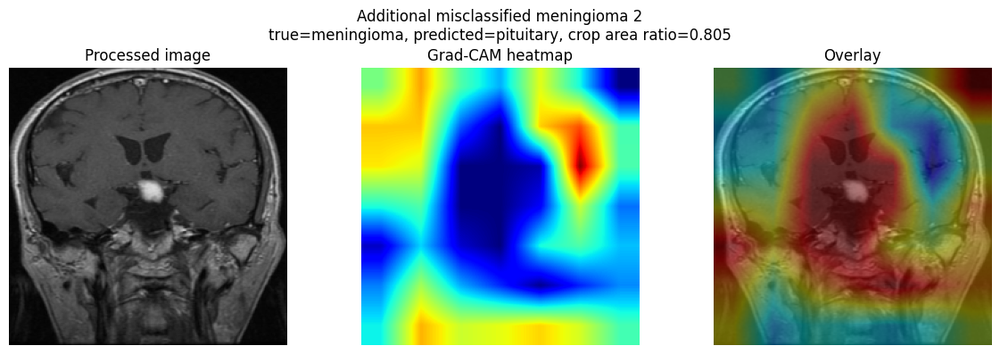

Saved figure: gradcam_figures\misclassified_meningioma_0151_additional_misclassified_meningioma_3.png


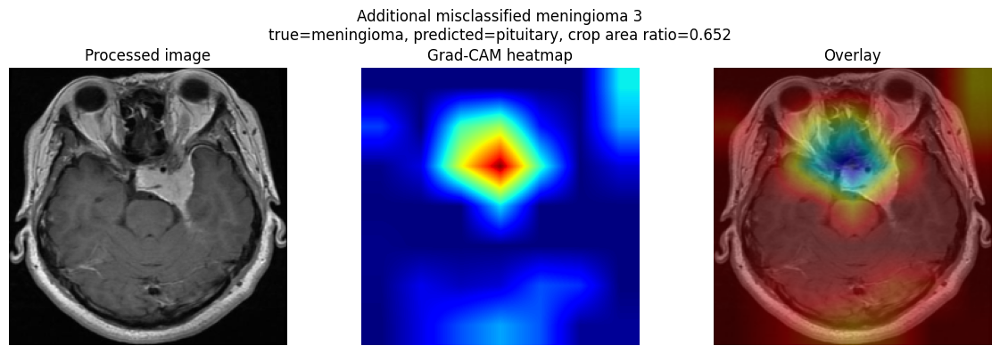

Saved figure: gradcam_figures\misclassified_meningioma_0167_additional_misclassified_meningioma_4.png


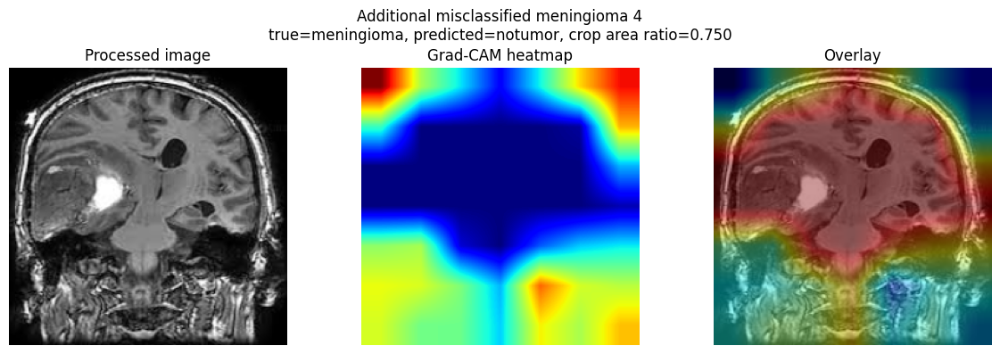

Saved figure: gradcam_figures\misclassified_meningioma_0181_additional_misclassified_meningioma_5.png


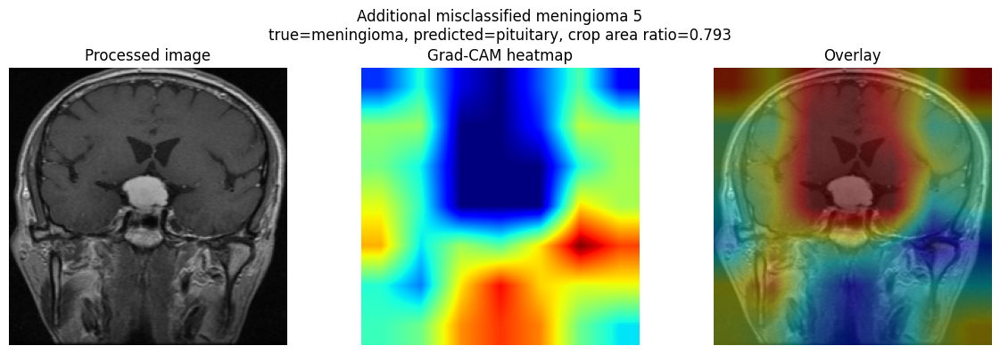


Energy definitions:
  Brain interior = thresholded foreground mask excluding the 16-pixel border band.
  Border = all pixels within 16 pixels of any image edge.

Meningioma Grad-CAM energy summary:


,Group,Cases,Mean_Brain_Interior_Energy,Median_Brain_Interior_Energy,Mean_Border_Energy,Median_Border_Energy,Mean_Crop_Area_Ratio
0,Misclassified meningioma,40,0.662713,0.642833,0.286947,0.309709,0.735520
1,Correct meningioma,240,0.789734,0.800114,0.177054,0.175312,0.650126


Saved per-case metrics to gradcam_figures/meningioma_gradcam_energy_by_case.csv
Saved summary metrics to gradcam_figures/meningioma_gradcam_energy_summary.csv


In [7]:
# Save additional Grad-CAM figures and quantify attention near the brain crop versus the image border.
gradcam_output_dir = 'gradcam_figures'
os.makedirs(gradcam_output_dir, exist_ok=True)


def slugify_plot_name(text):
    return ''.join(character.lower() if character.isalnum() else '_' for character in text).strip('_')


def render_gradcam(index, title, filename_prefix='gradcam'):
    image = validation_images[index]
    heatmap = make_gradcam_heatmap(
        validation_cam_inputs[index],
        int(validation_cam_predicted_labels[index])
    )
    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    overlay = cv2.addWeighted(image_rgb, 0.60, heatmap_color, 0.40, 0)
    true_name = class_names[int(validation_labels[index])]
    predicted_name = class_names[int(validation_cam_predicted_labels[index])]
    crop_ratio = validation_metadata_for_cam.iloc[index]['Bounding Box Area Ratio']

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Processed image')
    axes[1].imshow(heatmap, cmap='jet', vmin=0, vmax=1)
    axes[1].set_title('Grad-CAM heatmap')
    axes[2].imshow(overlay)
    axes[2].set_title('Overlay')
    for axis in axes:
        axis.axis('off')
    fig.suptitle(
        f'{title}\ntrue={true_name}, predicted={predicted_name}, '
        f'crop area ratio={crop_ratio:.3f}',
        fontsize=12
    )
    plt.tight_layout()

    output_path = os.path.join(
        gradcam_output_dir,
        f'{filename_prefix}_{index:04d}_{slugify_plot_name(title)}.png'
    )
    fig.savefig(output_path, dpi=200, bbox_inches='tight')
    print(f'Saved figure: {output_path}')
    plt.show()
    plt.close(fig)

    return {
        'index': index,
        'true': true_name,
        'predicted': predicted_name,
        'crop_area_ratio': float(crop_ratio),
        'figure_path': output_path
    }


def gradcam_energy_metrics(index, border_width=16):
    image = validation_images[index]
    heatmap = make_gradcam_heatmap(
        validation_cam_inputs[index],
        int(validation_cam_predicted_labels[index])
    )
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
    _, brain_mask = cv2.threshold(blurred_image, 15, 255, cv2.THRESH_BINARY)
    cleanup_kernel = np.ones((5, 5), dtype=np.uint8)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_OPEN, cleanup_kernel)
    brain_mask = cv2.morphologyEx(brain_mask, cv2.MORPH_CLOSE, cleanup_kernel) > 0
    if not brain_mask.any():
        brain_mask = np.ones_like(image, dtype=bool)

    border_mask = np.zeros_like(brain_mask, dtype=bool)
    border_mask[:border_width, :] = True
    border_mask[-border_width:, :] = True
    border_mask[:, :border_width] = True
    border_mask[:, -border_width:] = True
    interior_brain_mask = brain_mask & ~border_mask
    heatmap_energy = np.maximum(heatmap, 0)
    total_energy = heatmap_energy.sum() + np.finfo(float).eps

    true_name = class_names[int(validation_labels[index])]
    predicted_name = class_names[int(validation_cam_predicted_labels[index])]
    return {
        'Index': int(index),
        'True Class': true_name,
        'Predicted Class': predicted_name,
        'Correct': true_name == predicted_name,
        'Crop Area Ratio': float(validation_metadata_for_cam.iloc[index]['Bounding Box Area Ratio']),
        'Brain Interior Energy Fraction': float(heatmap_energy[interior_brain_mask].sum() / total_energy),
        'Border Energy Fraction': float(heatmap_energy[border_mask].sum() / total_energy),
        'Brain Mask Pixel Fraction': float(brain_mask.mean())
    }


# Review five additional errors after the two examples already inspected above.
additional_error_indices = misclassified_meningioma_indices[2:7]
print(f'Additional misclassified meningioma examples selected: {len(additional_error_indices)}')
for example_number, example_index in enumerate(additional_error_indices, start=1):
    render_gradcam(
        int(example_index),
        f'Additional misclassified meningioma {example_number}',
        filename_prefix='misclassified_meningioma'
    )


# Compare Grad-CAM energy distribution for all correct versus misclassified meningioma cases.
all_meningioma_energy = pd.DataFrame([
    gradcam_energy_metrics(int(index))
    for index in meningioma_indices
])
energy_summary = all_meningioma_energy.groupby('Correct').agg(
    Cases=('Index', 'size'),
    Mean_Brain_Interior_Energy=('Brain Interior Energy Fraction', 'mean'),
    Median_Brain_Interior_Energy=('Brain Interior Energy Fraction', 'median'),
    Mean_Border_Energy=('Border Energy Fraction', 'mean'),
    Median_Border_Energy=('Border Energy Fraction', 'median'),
    Mean_Crop_Area_Ratio=('Crop Area Ratio', 'mean')
).reset_index()
energy_summary['Group'] = energy_summary['Correct'].map({True: 'Correct meningioma', False: 'Misclassified meningioma'})
energy_summary = energy_summary[
    ['Group', 'Cases', 'Mean_Brain_Interior_Energy', 'Median_Brain_Interior_Energy',
     'Mean_Border_Energy', 'Median_Border_Energy', 'Mean_Crop_Area_Ratio']
]

all_meningioma_energy.to_csv(
    os.path.join(gradcam_output_dir, 'meningioma_gradcam_energy_by_case.csv'),
    index=False
)
energy_summary.to_csv(
    os.path.join(gradcam_output_dir, 'meningioma_gradcam_energy_summary.csv'),
    index=False
)

print('\nEnergy definitions:')
print('  Brain interior = thresholded foreground mask excluding the 16-pixel border band.')
print('  Border = all pixels within 16 pixels of any image edge.')
print('\nMeningioma Grad-CAM energy summary:')
display(energy_summary)
print(f'Saved per-case metrics to {gradcam_output_dir}/meningioma_gradcam_energy_by_case.csv')
print(f'Saved summary metrics to {gradcam_output_dir}/meningioma_gradcam_energy_summary.csv')

## Project Findings and Results

### EDA

- **Class balance:** Training and testing class counts were inspected before modeling, with stratified splitting used for train and validation data.
- **Data integrity:** Every listed image was opened, verified, and decoded; unreadable-file checks were retained in the notebook.
- **Dimension variance:** Image width and height distributions were measured before resizing, confirming that the source images were not uniform in shape.
- **Black-pixel fraction:** Near-black background coverage was summarized by class and used to motivate background-removal diagnostics, especially for `notumor` examples.
- **Grayscale confirmation:** Sampled RGB channels were compared to confirm that the source images are grayscale content stored in three-channel form.

### Preprocessing

Images were blurred, thresholded with the validated fixed threshold, cleaned with morphological opening and closing, and cropped to the largest contour before resizing to `224 x 224`. When no contour passed the minimum-area filter, the full image was retained and counted as a true fallback. Valid contours that covered the full image were tracked separately, preventing those cases from being confused with fallbacks.

### Baseline CNN

The four-block grayscale CNN reached **94.91% validation accuracy** in the reported run. Early experiments showed run-to-run variation because model initialization and augmentation were not fully seeded; the reproducibility cell above now sets the global TensorFlow/Keras seed to `42`, while the dataset shuffle seed remains fixed at `42`.

### Transfer Learning

EfficientNetB0 was trained in two phases: an ImageNet-frozen backbone phase followed by fine-tuning of the final 30 backbone layers. A real callback-state issue was debugged by loading the frozen checkpoint, rebuilding the fine-tuning callback objects, recompiling with the lower learning rate, and then fitting the fine-tuning phase. The reported fine-tuned model reached **94.64% validation accuracy**.

### Grad-CAM

Qualitative review of the original examples plus five additional misclassified meningioma cases showed repeated attention near the image border or outside the central brain region. Quantitatively, across 40 misclassified and 240 correctly classified meningioma validation cases:

- Mean brain-interior heatmap energy: **66.3%** for misclassified cases versus **79.0%** for correct cases.
- Mean border heatmap energy: **28.7%** for misclassified cases versus **17.7%** for correct cases.

The energy analysis uses a thresholded foreground mask with a 16-pixel border band. It is a reproducible attention proxy, not an anatomical segmentation, but it connects the Grad-CAM result back to the earlier black-background and cropping observations from EDA. Saved figures and per-case/grouped metrics are in `gradcam_figures/`.

In [10]:
# Fresh, test-only evaluation of both saved models.
import gc
import os

import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from tensorflow.keras.applications.efficientnet import preprocess_input

# Clear models and tensors left by earlier notebook sections before reloading checkpoints.
tf.keras.backend.clear_session()
gc.collect()

test_images = np.load('test_images.npy')
test_labels = np.load('test_labels.npy')
class_mapping_df = pd.read_csv('class_mapping.csv')
class_names = class_mapping_df.sort_values('Class Index')['Class Name'].tolist()

assert len(test_images) == len(test_labels)
assert len(class_names) == int(np.max(test_labels)) + 1
print(f'Test images: {test_images.shape}')
print(f'Test labels: {test_labels.shape}')
print(f'Class names: {class_names}')

# Baseline CNN: one grayscale channel and 0-1 normalization.
baseline_test_images = test_images[..., np.newaxis].astype(np.float32) / 255.0
baseline_model = tf.keras.models.load_model('baseline_cnn.keras')
baseline_probabilities = baseline_model.predict(baseline_test_images, batch_size=8, verbose=0)
baseline_predicted_labels = np.argmax(baseline_probabilities, axis=1)

baseline_report = classification_report(
    test_labels,
    baseline_predicted_labels,
    labels=np.arange(len(class_names)),
    target_names=class_names,
    digits=4,
    zero_division=0
)
baseline_confusion = confusion_matrix(
    test_labels,
    baseline_predicted_labels,
    labels=np.arange(len(class_names))
)
print('\nBaseline CNN test classification report:')
print(baseline_report)
print('Baseline CNN test confusion matrix:')
print(baseline_confusion)

baseline_test_accuracy = accuracy_score(test_labels, baseline_predicted_labels)
baseline_macro_f1 = f1_score(
    test_labels,
    baseline_predicted_labels,
    labels=np.arange(len(class_names)),
    average='macro',
    zero_division=0
)

# Release the baseline model and predictions before loading EfficientNet.
del baseline_model, baseline_probabilities, baseline_predicted_labels, baseline_test_images
tf.keras.backend.clear_session()
gc.collect()

# EfficientNetB0: repeat grayscale into three channels and use EfficientNet preprocessing.
efficientnet_test_images = np.repeat(test_images[..., np.newaxis], 3, axis=-1).astype(np.float32)
efficientnet_test_inputs = preprocess_input(efficientnet_test_images)
efficientnet_model = tf.keras.models.load_model('efficientnet_finetuned.keras')
efficientnet_probabilities = efficientnet_model.predict(
    efficientnet_test_inputs,
    batch_size=8,
    verbose=0
)
efficientnet_predicted_labels = np.argmax(efficientnet_probabilities, axis=1)

efficientnet_report = classification_report(
    test_labels,
    efficientnet_predicted_labels,
    labels=np.arange(len(class_names)),
    target_names=class_names,
    digits=4,
    zero_division=0
)
efficientnet_confusion = confusion_matrix(
    test_labels,
    efficientnet_predicted_labels,
    labels=np.arange(len(class_names))
)
print('\nEfficientNetB0 fine-tuned test classification report:')
print(efficientnet_report)
print('EfficientNetB0 fine-tuned test confusion matrix:')
print(efficientnet_confusion)

efficientnet_test_accuracy = accuracy_score(test_labels, efficientnet_predicted_labels)
efficientnet_macro_f1 = f1_score(
    test_labels,
    efficientnet_predicted_labels,
    labels=np.arange(len(class_names)),
    average='macro',
    zero_division=0
)

comparison_table = pd.DataFrame([
    {
        'Model': 'Baseline CNN',
        'Test Accuracy': baseline_test_accuracy,
        'Macro F1': baseline_macro_f1
    },
    {
        'Model': 'EfficientNetB0 fine-tuned',
        'Test Accuracy': efficientnet_test_accuracy,
        'Macro F1': efficientnet_macro_f1
    }
])
comparison_table.to_csv('test_model_comparison.csv', index=False)

print('\nFinal test-set comparison:')
display(comparison_table)
print('Saved final comparison to test_model_comparison.csv')


Test images: (1600, 224, 224)
Test labels: (1600,)
Class names: ['glioma', 'meningioma', 'notumor', 'pituitary']

Baseline CNN test classification report:
              precision    recall  f1-score   support

      glioma     0.9806    0.7575    0.8547       400
  meningioma     0.9018    0.8950    0.8984       400
     notumor     0.8658    1.0000    0.9281       400
   pituitary     0.9190    0.9925    0.9543       400

    accuracy                         0.9113      1600
   macro avg     0.9168    0.9113    0.9089      1600
weighted avg     0.9168    0.9113    0.9089      1600

Baseline CNN test confusion matrix:
[[303  36  49  12]
 [  6 358  13  23]
 [  0   0 400   0]
 [  0   3   0 397]]

EfficientNetB0 fine-tuned test classification report:
              precision    recall  f1-score   support

      glioma     0.9590    0.7600    0.8480       400
  meningioma     0.8447    0.8975    0.8703       400
     notumor     0.9259    1.0000    0.9615       400
   pituitary     0.9366 

,Model,Test Accuracy,Macro F1
0,Baseline CNN,0.91125,0.908874
1,EfficientNetB0 fine-tuned,0.91375,0.911480


Saved final comparison to test_model_comparison.csv


Baseline CNN training-history check:
  Final training accuracy: 0.9754
  Best training accuracy: 0.9754
  Final validation accuracy: 0.9580
  Best validation accuracy: 0.9580
Saved glioma comparison grid: test_glioma_diagnostics\glioma_training_testing_comparison.png


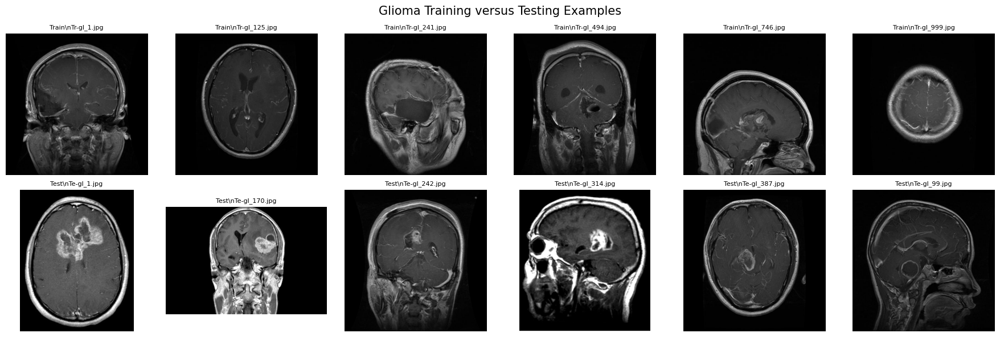


Glioma test error destinations:


,Model,Glioma -> meningioma,Glioma -> notumor,Glioma -> pituitary
0,Baseline CNN,36,49,12
1,EfficientNetB0 fine-tuned,66,26,4


EfficientNet glioma -> notumor cases available: 26
Saved Grad-CAM: test_glioma_diagnostics\glioma_notumor_gradcam_1.png


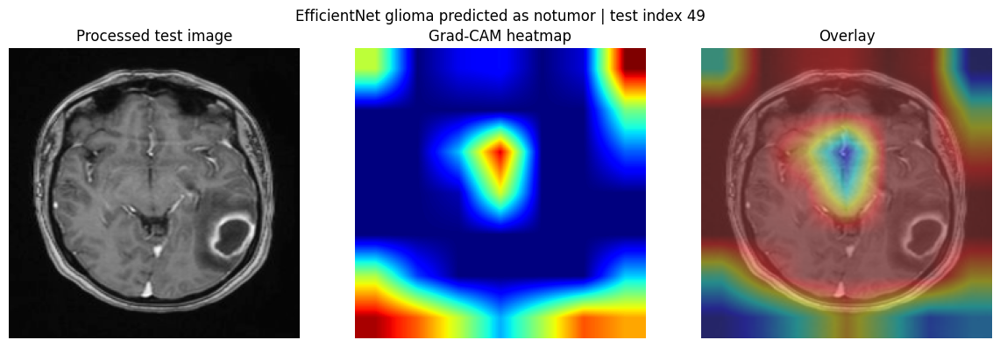

Saved Grad-CAM: test_glioma_diagnostics\glioma_notumor_gradcam_2.png


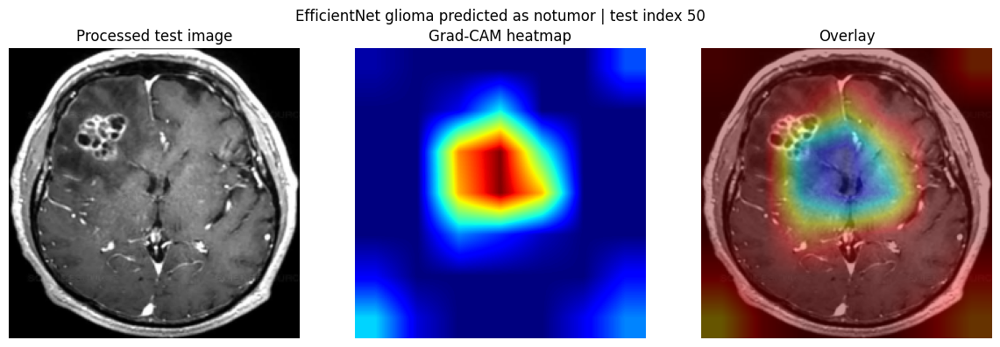

Saved Grad-CAM: test_glioma_diagnostics\glioma_notumor_gradcam_3.png


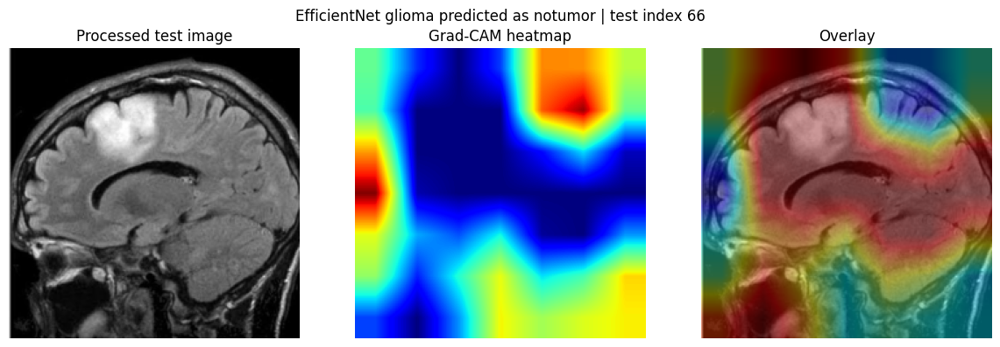

Grad-CAM target layer for test diagnostics: top_conv


In [12]:
# Diagnose baseline overfitting versus train/test distribution shift for glioma.
import json
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image

analysis_output_dir = Path('test_glioma_diagnostics')
analysis_output_dir.mkdir(exist_ok=True)

# 1. Inspect the saved baseline training history.
with open('baseline_history.json', 'r') as history_file:
    baseline_history_from_disk = json.load(history_file)

baseline_final_train_accuracy = baseline_history_from_disk['accuracy'][-1]
baseline_best_train_accuracy = max(baseline_history_from_disk['accuracy'])
baseline_final_validation_accuracy = baseline_history_from_disk['val_accuracy'][-1]
baseline_best_validation_accuracy = max(baseline_history_from_disk['val_accuracy'])
print('Baseline CNN training-history check:')
print(f'  Final training accuracy: {baseline_final_train_accuracy:.4f}')
print(f'  Best training accuracy: {baseline_best_train_accuracy:.4f}')
print(f'  Final validation accuracy: {baseline_final_validation_accuracy:.4f}')
print(f'  Best validation accuracy: {baseline_best_validation_accuracy:.4f}')

# 2. Compare deterministic glioma samples from the original Training and Testing folders.
training_glioma_paths = sorted(Path('archive/Training/glioma').glob('*'))
testing_glioma_paths = sorted(Path('archive/Testing/glioma').glob('*'))
sample_count = 6
training_sample_paths = [
    training_glioma_paths[index]
    for index in np.linspace(0, len(training_glioma_paths) - 1, sample_count, dtype=int)
]
testing_sample_paths = [
    testing_glioma_paths[index]
    for index in np.linspace(0, len(testing_glioma_paths) - 1, sample_count, dtype=int)
]

fig, axes = plt.subplots(2, sample_count, figsize=(18, 6))
for column, image_path in enumerate(training_sample_paths):
    axes[0, column].imshow(Image.open(image_path).convert('L'), cmap='gray')
    axes[0, column].set_title(f'Train\\n{image_path.name}', fontsize=8)
    axes[0, column].axis('off')
for column, image_path in enumerate(testing_sample_paths):
    axes[1, column].imshow(Image.open(image_path).convert('L'), cmap='gray')
    axes[1, column].set_title(f'Test\\n{image_path.name}', fontsize=8)
    axes[1, column].axis('off')
axes[0, 0].set_ylabel('Glioma training', fontsize=10)
axes[1, 0].set_ylabel('Glioma testing', fontsize=10)
fig.suptitle('Glioma Training versus Testing Examples', fontsize=15)
fig.tight_layout()
glioma_comparison_path = analysis_output_dir / 'glioma_training_testing_comparison.png'
fig.savefig(glioma_comparison_path, dpi=200, bbox_inches='tight')
print(f'Saved glioma comparison grid: {glioma_comparison_path}')
plt.show()
plt.close(fig)

# 3. Report the main glioma error destinations from both saved test confusion matrices.
glioma_error_table = pd.DataFrame([
    {
        'Model': 'Baseline CNN',
        'Glioma -> meningioma': int(baseline_confusion[0, 1]),
        'Glioma -> notumor': int(baseline_confusion[0, 2]),
        'Glioma -> pituitary': int(baseline_confusion[0, 3])
    },
    {
        'Model': 'EfficientNetB0 fine-tuned',
        'Glioma -> meningioma': int(efficientnet_confusion[0, 1]),
        'Glioma -> notumor': int(efficientnet_confusion[0, 2]),
        'Glioma -> pituitary': int(efficientnet_confusion[0, 3])
    }
])
print('\nGlioma test error destinations:')
display(glioma_error_table)
glioma_error_table.to_csv(analysis_output_dir / 'glioma_test_error_destinations.csv', index=False)

# 4. Grad-CAM the first three EfficientNet gliomas misclassified as notumor.
test_glioma_notumor_indices = np.flatnonzero(
    (test_labels == class_names.index('glioma'))
    & (efficientnet_predicted_labels == class_names.index('notumor'))
)
print(f'EfficientNet glioma -> notumor cases available: {len(test_glioma_notumor_indices)}')

cam_base_model = efficientnet_model.get_layer('efficientnetb0')
cam_classifier_layers = [
    layer for layer in efficientnet_model.layers if layer.name != cam_base_model.name
]
cam_conv_layer_names = [
    layer.name for layer in cam_base_model.layers
    if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.DepthwiseConv2D))
    and len(layer.output.shape) == 4
]
cam_target_layer_name = next(
    (name for name in ['top_conv', 'top_activation'] if name in cam_conv_layer_names),
    cam_conv_layer_names[-1]
)
cam_target_layer = cam_base_model.get_layer(cam_target_layer_name)
test_grad_model = tf.keras.models.Model(
    cam_base_model.inputs,
    [cam_target_layer.output, cam_base_model.output]
)


def make_test_gradcam_heatmap(image_index):
    image_tensor = efficientnet_test_inputs[image_index]
    image_batch = tf.expand_dims(image_tensor, axis=0)
    with tf.GradientTape() as tape:
        conv_outputs, features = test_grad_model(image_batch, training=False)
        tape.watch(conv_outputs)
        predictions = features
        for layer in cam_classifier_layers:
            predictions = layer(predictions, training=False)
        class_index = int(efficientnet_predicted_labels[image_index])
        class_score = predictions[:, class_index]
    gradients = tape.gradient(class_score, conv_outputs)
    channel_weights = tf.reduce_mean(gradients, axis=(1, 2))
    heatmap = tf.reduce_sum(
        conv_outputs * channel_weights[:, tf.newaxis, tf.newaxis, :], axis=-1
    )
    heatmap = tf.maximum(heatmap, 0)[0]
    heatmap = heatmap / (tf.reduce_max(heatmap) + tf.keras.backend.epsilon())
    return tf.image.resize(heatmap[..., tf.newaxis], (224, 224))[..., 0].numpy()


for panel_number, image_index in enumerate(test_glioma_notumor_indices[:3], start=1):
    image = test_images[image_index]
    heatmap = make_test_gradcam_heatmap(int(image_index))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB), 0.60, heatmap_color, 0.40, 0)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Processed test image')
    axes[1].imshow(heatmap, cmap='jet', vmin=0, vmax=1)
    axes[1].set_title('Grad-CAM heatmap')
    axes[2].imshow(overlay)
    axes[2].set_title('Overlay')
    for axis in axes:
        axis.axis('off')
    fig.suptitle(
        f'EfficientNet glioma predicted as notumor | test index {int(image_index)}',
        fontsize=12
    )
    fig.tight_layout()
    output_path = analysis_output_dir / f'glioma_notumor_gradcam_{panel_number}.png'
    fig.savefig(output_path, dpi=200, bbox_inches='tight')
    print(f'Saved Grad-CAM: {output_path}')
    plt.show()
    plt.close(fig)

print(f'Grad-CAM target layer for test diagnostics: {cam_target_layer_name}')

## Glioma Test-Set Diagnostics

The saved baseline history ends at **97.54% training accuracy** and **95.80% validation accuracy**. This confirms a modest train/validation gap, but not extreme memorization by itself; the larger drop to **75.75% glioma recall** on the baseline test set indicates that test performance is affected by more than ordinary training overfit.

The side-by-side folder sample is saved as `test_glioma_diagnostics/glioma_training_testing_comparison.png`. In this quick visual check, the testing examples show more varied framing, slice orientation, contrast, and lesion presentation than the sampled training examples. This supports a distribution-shift hypothesis, although the sample is descriptive rather than a formal image-distribution test.

On the held-out test set, glioma error destinations were:

- **Baseline CNN:** 36 gliomas predicted as meningioma, 49 as `notumor`, and 12 as pituitary.
- **Fine-tuned EfficientNetB0:** 66 gliomas predicted as meningioma, 26 as `notumor`, and 4 as pituitary.

Three EfficientNet glioma-to-`notumor` Grad-CAM panels are saved under `test_glioma_diagnostics/`. The examples include a case where attention is concentrated near the central brain region, but also cases where activation shifts toward the image border or away from the visible lesion. That makes small/subtle lesions and test-set presentation differences plausible contributors, rather than supporting a single universal shortcut-learning explanation.